# install required libraries 

In [2]:
pip install keras-tuner

# Importing required libararies

In [10]:
# TensorFlow and Keras Imports
import tensorflow as tf
from tensorflow.keras.regularizers import l1_l2, l2
from tensorflow.keras.applications import InceptionV3, ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, LearningRateScheduler, TensorBoard, Callback
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam
import keras_tuner
from keras_tuner.tuners import RandomSearch

# Scikit-Learn Imports
from sklearn.utils import class_weight
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix

# Standard Python Libraries
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.dates as mdates
from matplotlib.dates import date2num
import os
import shutil
import datetime
import os
import random
from datetime import datetime, timedelta

# Activation of GPU skip this if you don't have external gpu and CUDA driver

In [33]:
# Verifica se una GPU è disponibile e abilita l'accelerazione grafica con GPU

if tf.config.experimental.list_physical_devices('GPU'):
    gpus = tf.config.experimental.list_physical_devices('GPU')
    tf.config.experimental.set_memory_growth(gpus[0], True)
print(gpus)

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
  except RuntimeError as e:
    print(e)


[]


# load the given sample_dataset 

In [6]:
#Load dataset
data_dir = "D:\C&G materials\Dataset 4training splitted_Lignano"

# setting of hyper parameters

batch_size = 8
img_height = 224
img_width = 224

# Augmentation settings for training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    vertical_flip=False,
    width_shift_range=[-30,30],
    height_shift_range=[-30,30],
    zoom_range=[0.9,1.1],
    fill_mode='nearest',
)

# No augmentation for validation and test sets, only rescaling
val_datagen = ImageDataGenerator(rescale=1./255)

# Generators
train_generator = train_datagen.flow_from_directory(
    os.path.join(data_dir, 'train'),
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
    os.path.join(data_dir, 'test'),
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)


Found 329 images belonging to 34 classes.
Found 101 images belonging to 34 classes.


# visualization of agumented images

(-0.5, 7499.5, 2047.5, -0.5)

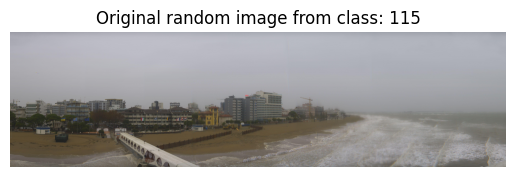

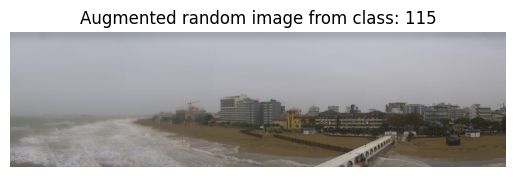

In [36]:
# VISUALIZZAZONE DELLE IMMAGINI AUMENTATE
target_class = random.choice(list(train_generator.class_indices.keys()))  # choose a random class
target_dir = 'D:/C&G materials/Dataset 4training splitted_Lignano/train' + str(target_class) # Provide train directory from sample dataset
random_image = random.choice(os.listdir(target_dir)) # choose a random image from target directory
random_image_path = target_dir + "/" + random_image # create the choosen random image path
img = mpimg.imread(random_image_path) # read in the chosen target image
plt.imshow(img) # plot the target image
plt.title(f"Original random image from class: {target_class}")
plt.axis(False); # turn off the axes

# Applica la data augmentation
augmented_img = train_datagen.flow(tf.expand_dims(img, axis=0), shuffle=False).next()[0]
# Visualizza l'immagine augmentata
plt.figure()
plt.imshow((augmented_img * 255).astype(np.uint8))
plt.title(f"Augmented random image from class: {target_class}")
plt.axis(False)

# Distribution of frames with respect to classes

Distribuzione delle classi per train_generator:
Classe 0: 11 immagini
Classe 1: 8 immagini
Classe 2: 10 immagini
Classe 3: 8 immagini
Classe 4: 9 immagini
Classe 5: 9 immagini
Classe 6: 12 immagini
Classe 7: 9 immagini
Classe 8: 12 immagini
Classe 9: 8 immagini
Classe 10: 11 immagini
Classe 11: 8 immagini
Classe 12: 9 immagini
Classe 13: 9 immagini
Classe 14: 12 immagini
Classe 15: 10 immagini
Classe 16: 8 immagini
Classe 17: 9 immagini
Classe 18: 9 immagini
Classe 19: 9 immagini
Classe 20: 12 immagini
Classe 21: 9 immagini
Classe 22: 9 immagini
Classe 23: 8 immagini
Classe 24: 9 immagini
Classe 25: 11 immagini
Classe 26: 9 immagini
Classe 27: 12 immagini
Classe 28: 9 immagini
Classe 29: 10 immagini
Classe 30: 9 immagini
Classe 31: 9 immagini
Classe 32: 11 immagini
Classe 33: 12 immagini


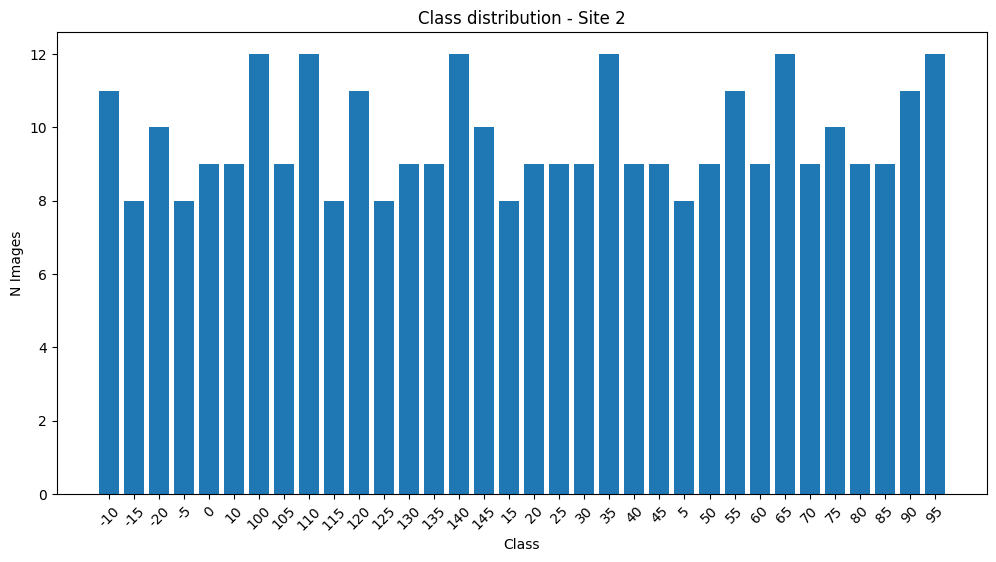

Distribuzione delle classi per val_generator:
Classe 0: 3 immagini
Classe 1: 2 immagini
Classe 2: 3 immagini
Classe 3: 2 immagini
Classe 4: 3 immagini
Classe 5: 3 immagini
Classe 6: 3 immagini
Classe 7: 3 immagini
Classe 8: 4 immagini
Classe 9: 3 immagini
Classe 10: 3 immagini
Classe 11: 2 immagini
Classe 12: 3 immagini
Classe 13: 3 immagini
Classe 14: 3 immagini
Classe 15: 3 immagini
Classe 16: 2 immagini
Classe 17: 3 immagini
Classe 18: 3 immagini
Classe 19: 3 immagini
Classe 20: 3 immagini
Classe 21: 3 immagini
Classe 22: 3 immagini
Classe 23: 3 immagini
Classe 24: 3 immagini
Classe 25: 3 immagini
Classe 26: 3 immagini
Classe 27: 4 immagini
Classe 28: 3 immagini
Classe 29: 3 immagini
Classe 30: 3 immagini
Classe 31: 3 immagini
Classe 32: 3 immagini
Classe 33: 4 immagini


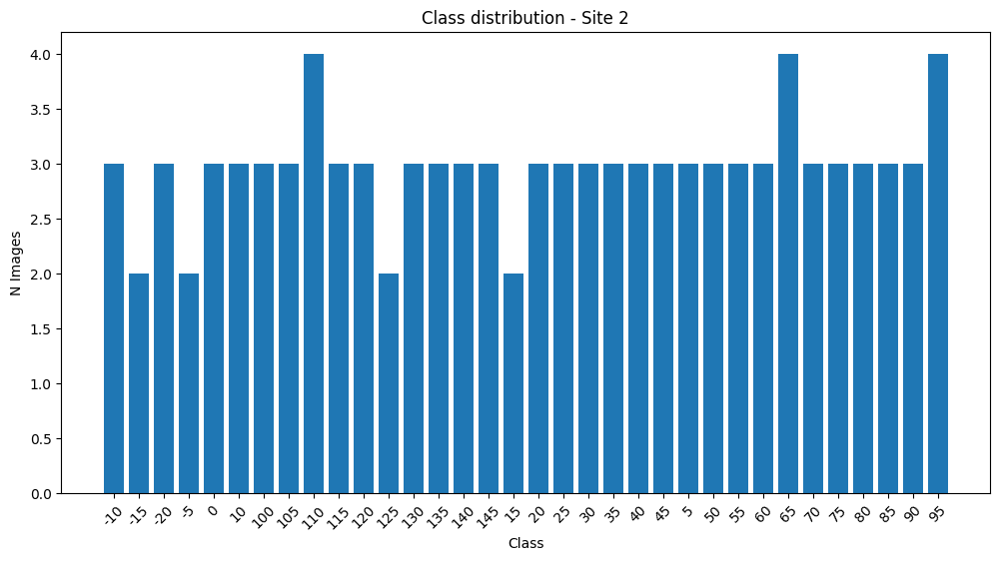

In [37]:
#%% Distribuzione delle classi

def show_class_distribution(generator, generator_name):
    # Ottieni l'indice delle classi
    #print(generator.class_indices)

    # Calcola la distribuzione delle classi
    class_distribution = np.bincount(generator.classes)

    # Stampa la distribuzione
    print(f"Distribuzione delle classi per {generator_name}:")
    for idx, count in enumerate(class_distribution):
        print(f"Classe {idx}: {count} immagini")

    # Crea un grafico a barre della distribuzione delle classi
    labels = list(generator.class_indices.keys())
    plt.figure(figsize=(12, 6))
    plt.bar(labels, class_distribution)
    plt.xlabel('Class')
    plt.ylabel('N Images')
    plt.title(f'Class distribution - Site 2')
    plt.xticks(rotation=45)
    plt.show()

# Usa la funzione sui generatori di addestramento e validazione
show_class_distribution(train_generator, 'train_generator')
show_class_distribution(val_generator, 'val_generator')


# Defining the model

In [38]:
base_model = InceptionV3(weights='imagenet', include_top=False)
x = base_model.output
x = GlobalAveragePooling2D()(x)
#x = Dropout(0.2)(x)
#predictions = Dense(train_generator.num_classes, activation='softmax')(x)
predictions = Dense(train_generator.num_classes,  activation='softmax', kernel_regularizer=l1_l2(l1=0.001, l2=0.001))(x)
model = Model(inputs=base_model.input, outputs=predictions)

for layer in base_model.layers [:10]:
    layer.trainable = False

# Compilazione del modello
model.compile(optimizer=SGD(learning_rate=0.003, momentum=0.9), loss='categorical_crossentropy',  metrics=['accuracy'])

87910968/87910968 [==============================] - 4s 0us/step


# Structure of the model

In [39]:
# STRUTTURA DEL MODELLO

model.summary()
print('Numero totale dei layer nel modello: ', len(model.layers))

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   864         ['input_1[0][0]']                
                                32)                                                               
                                                                                                  
 batch_normalization (BatchNorm  (None, None, None,   96         ['conv2d[0][0]']                 
 alization)                     32)                                                           

                                                                                                  
 average_pooling2d (AveragePool  (None, None, None,   0          ['max_pooling2d_1[0][0]']        
 ing2D)                         192)                                                              
                                                                                                  
 conv2d_5 (Conv2D)              (None, None, None,   12288       ['max_pooling2d_1[0][0]']        
                                64)                                                               
                                                                                                  
 conv2d_7 (Conv2D)              (None, None, None,   76800       ['activation_6[0][0]']           
                                64)                                                               
                                                                                                  
 conv2d_10

                                                                                                  
 conv2d_18 (Conv2D)             (None, None, None,   16384       ['average_pooling2d_1[0][0]']    
                                64)                                                               
                                                                                                  
 batch_normalization_12 (BatchN  (None, None, None,   192        ['conv2d_12[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 batch_normalization_14 (BatchN  (None, None, None,   192        ['conv2d_14[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 batch_nor

                                                                                                  
 batch_normalization_25 (BatchN  (None, None, None,   192        ['conv2d_25[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 activation_19 (Activation)     (None, None, None,   0           ['batch_normalization_19[0][0]'] 
                                64)                                                               
                                                                                                  
 activation_21 (Activation)     (None, None, None,   0           ['batch_normalization_21[0][0]'] 
                                64)                                                               
                                                                                                  
 activatio

                                128)                                                              
                                                                                                  
 conv2d_36 (Conv2D)             (None, None, None,   114688      ['activation_35[0][0]']          
                                128)                                                              
                                                                                                  
 batch_normalization_31 (BatchN  (None, None, None,   384        ['conv2d_31[0][0]']              
 ormalization)                  128)                                                              
                                                                                                  
 batch_normalization_36 (BatchN  (None, None, None,   384        ['conv2d_36[0][0]']              
 ormalization)                  128)                                                              
          

 ormalization)                  160)                                                              
                                                                                                  
 activation_44 (Activation)     (None, None, None,   0           ['batch_normalization_44[0][0]'] 
                                160)                                                              
                                                                                                  
 conv2d_45 (Conv2D)             (None, None, None,   179200      ['activation_44[0][0]']          
                                160)                                                              
                                                                                                  
 batch_normalization_45 (BatchN  (None, None, None,   480        ['conv2d_45[0][0]']              
 ormalization)                  160)                                                              
          

 activation_48 (Activation)     (None, None, None,   0           ['batch_normalization_48[0][0]'] 
                                192)                                                              
                                                                                                  
 activation_49 (Activation)     (None, None, None,   0           ['batch_normalization_49[0][0]'] 
                                192)                                                              
                                                                                                  
 mixed5 (Concatenate)           (None, None, None,   0           ['activation_40[0][0]',          
                                768)                              'activation_43[0][0]',          
                                                                  'activation_48[0][0]',          
                                                                  'activation_49[0][0]']          
          

 batch_normalization_53 (BatchN  (None, None, None,   576        ['conv2d_53[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 batch_normalization_58 (BatchN  (None, None, None,   576        ['conv2d_58[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 batch_normalization_59 (BatchN  (None, None, None,   576        ['conv2d_59[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 activation_50 (Activation)     (None, None, None,   0           ['batch_normalization_50[0][0]'] 
          

 conv2d_60 (Conv2D)             (None, None, None,   147456      ['mixed6[0][0]']                 
                                192)                                                              
                                                                                                  
 conv2d_63 (Conv2D)             (None, None, None,   258048      ['activation_62[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_68 (Conv2D)             (None, None, None,   258048      ['activation_67[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_69 (Conv2D)             (None, None, None,   147456      ['average_pooling2d_6[0][0]']    
          

 batch_normalization_71 (BatchN  (None, None, None,   960        ['conv2d_71[0][0]']              
 ormalization)                  320)                                                              
                                                                                                  
 batch_normalization_75 (BatchN  (None, None, None,   576        ['conv2d_75[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 activation_71 (Activation)     (None, None, None,   0           ['batch_normalization_71[0][0]'] 
                                320)                                                              
                                                                                                  
 activation_75 (Activation)     (None, None, None,   0           ['batch_normalization_75[0][0]'] 
          

                                384)                                                              
                                                                                                  
 activation_79 (Activation)     (None, None, None,   0           ['batch_normalization_79[0][0]'] 
                                384)                                                              
                                                                                                  
 activation_82 (Activation)     (None, None, None,   0           ['batch_normalization_82[0][0]'] 
                                384)                                                              
                                                                                                  
 activation_83 (Activation)     (None, None, None,   0           ['batch_normalization_83[0][0]'] 
                                384)                                                              
          

 ormalization)                  384)                                                              
                                                                                                  
 batch_normalization_92 (BatchN  (None, None, None,   1152       ['conv2d_92[0][0]']              
 ormalization)                  384)                                                              
                                                                                                  
 conv2d_93 (Conv2D)             (None, None, None,   393216      ['average_pooling2d_8[0][0]']    
                                192)                                                              
                                                                                                  
 batch_normalization_85 (BatchN  (None, None, None,   960        ['conv2d_85[0][0]']              
 ormalization)                  320)                                                              
          

# visualization of trainable layers

In [40]:
# LAYER ADDESTRABILI DEL MODELLO
print(len(model.trainable_variables))

184


# Shows trainable layers in the base model

In [41]:
for layer_number, layer in enumerate(model.layers):
  print(layer_number, layer.name,layer.trainable)

0 input_1 False
1 conv2d False
2 batch_normalization False
3 activation False
4 conv2d_1 False
5 batch_normalization_1 False
6 activation_1 False
7 conv2d_2 False
8 batch_normalization_2 False
9 activation_2 False
10 max_pooling2d True
11 conv2d_3 True
12 batch_normalization_3 True
13 activation_3 True
14 conv2d_4 True
15 batch_normalization_4 True
16 activation_4 True
17 max_pooling2d_1 True
18 conv2d_8 True
19 batch_normalization_8 True
20 activation_8 True
21 conv2d_6 True
22 conv2d_9 True
23 batch_normalization_6 True
24 batch_normalization_9 True
25 activation_6 True
26 activation_9 True
27 average_pooling2d True
28 conv2d_5 True
29 conv2d_7 True
30 conv2d_10 True
31 conv2d_11 True
32 batch_normalization_5 True
33 batch_normalization_7 True
34 batch_normalization_10 True
35 batch_normalization_11 True
36 activation_5 True
37 activation_7 True
38 activation_10 True
39 activation_11 True
40 mixed0 True
41 conv2d_15 True
42 batch_normalization_15 True
43 activation_15 True
44 conv2d_

# Optimization
# Reduced learning rate when validation loss stopped improving

In [42]:
import datetime

lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-7)
# Interrompe l'addestramento quando la perdita di convalida ha smesso di migliorare
early_stopping = EarlyStopping(monitor='val_loss', patience=5)

# # Management of imbalance between classes

# Calculate class weights

In [43]:

unique_classes = np.unique(train_generator.classes)
class_weights = compute_class_weight('balanced', classes=unique_classes, y=train_generator.classes)
# Convertire i pesi delle classi in un dizionario
class_weight_dict = dict(zip(unique_classes, class_weights))

# # Model training

In [44]:

history = model.fit(train_generator, validation_data=val_generator, epochs=35, class_weight=class_weight_dict)

Epoch 1/35
42/42 [==============================] - 216s 5s/step - loss: 5.4518 - accuracy: 0.0760 - val_loss: 5.9413 - val_accuracy: 0.0495
Epoch 2/35
42/42 [==============================] - 174s 4s/step - loss: 4.8856 - accuracy: 0.1733 - val_loss: 5.6492 - val_accuracy: 0.0594
Epoch 3/35
42/42 [==============================] - 178s 4s/step - loss: 4.3287 - accuracy: 0.2644 - val_loss: 4.6050 - val_accuracy: 0.2079
Epoch 4/35
42/42 [==============================] - 177s 4s/step - loss: 3.9086 - accuracy: 0.3070 - val_loss: 4.2252 - val_accuracy: 0.2970
Epoch 5/35
42/42 [==============================] - 177s 4s/step - loss: 3.4778 - accuracy: 0.4225 - val_loss: 3.9310 - val_accuracy: 0.3069
Epoch 6/35
42/42 [==============================] - 174s 4s/step - loss: 3.0942 - accuracy: 0.5289 - val_loss: 3.6807 - val_accuracy: 0.3663
Epoch 7/35
42/42 [==============================] - 178s 4s/step - loss: 2.9401 - accuracy: 0.5258 - val_loss: 3.1960 - val_accuracy: 0.4554
Epoch 8/35
42

#  PLOT TRAINING HISTORY
# Track learning curves

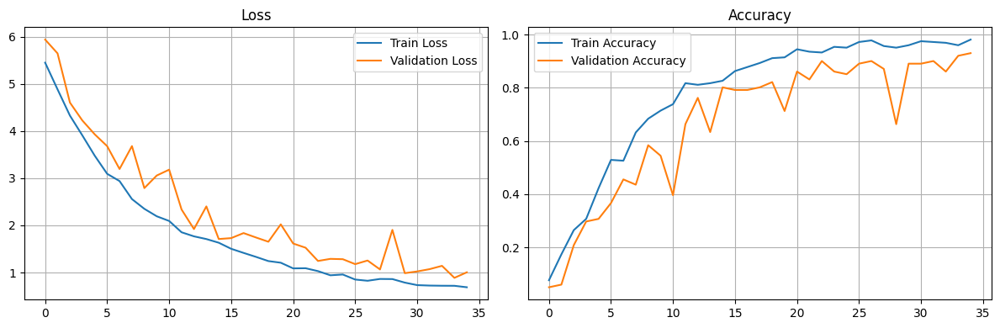

In [45]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.grid(True)
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')  # Use 'acc' if you get key error for 'accuracy'
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')  # Use 'val_acc' if you get key error for 'val_accuracy'
plt.title('Accuracy')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

#  MODEL ACCURACY

In [46]:
# Provide test directory path from sample_dataset
test_dir = "D:/C&G materials/Dataset 4training splitted_Lignano/test" #Provide the test directory from Sample dataset
# Ottieni il dizionario che mappa i nomi di classe agli indici di classe
class_indices = val_generator.class_indices
# Inverti il dizionario per mappare gli indici di classe ai nomi di classe
class_names = {v: k for k, v in class_indices.items()}
# scalare le immagini
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False)

# ACCURACY OF MODEL
y_pred_test = model.predict(test_generator)
y_pred_test_classes = np.argmax(y_pred_test, axis=1)
accuracy_test = np.mean(y_pred_test_classes == test_generator.classes)
print(f"Test accuracy: {accuracy_test * 100:.2f}%")

Found 101 images belonging to 34 classes.
13/13 [==============================] - 29s 2s/step
Test accuracy: 93.07%


# VIEW PREDICTIONS ON 4 RANDOM IMAGES TAKEN FROM TEST

13/13 [==============================] - 26s 2s/step


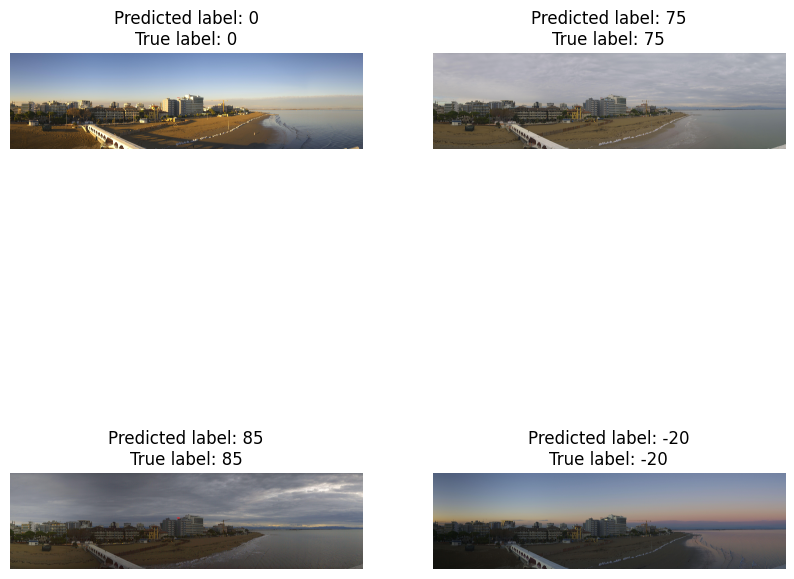

In [47]:
# Ottieni il dizionario che mappa i nomi di classe agli indici di classe
class_indices = val_generator.class_indices
# Inverti il dizionario per mappare gli indici di classe ai nomi di classe
class_names = {v: k for k, v in class_indices.items()}
# Predizione e calcolo dell'accuratezza
y_pred = model.predict(val_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
# Converti gli indici di classe nei nomi di classe
y_pred_names = [class_names[i] for i in y_pred_classes]

data_dir = "D:/C&G materials/Dataset 4training splitted_Lignano/test"  # provide the test directory from sample dataset

# Obtain the dictionary that maps class names to class indices
class_indices = val_generator.class_indices

# Invert the dictionary to map class indices to class names
class_names = {v: k for k, v in class_indices.items()}

# Get ground truth labels from val_generator
y_true = val_generator.classes  # Assuming val_generator holds the true labels

# Display 4 random images with their predicted and true labels
random_indices = np.random.choice(range(len(val_generator.filenames)), size=4)
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

for i, ax in enumerate(axes.flat):
    full_path = os.path.join(data_dir, val_generator.filenames[random_indices[i]])

    # Check if file exists
    if os.path.exists(full_path):
        img = plt.imread(full_path)
    else:
        print(f"File does not exist: {full_path}")
        continue

    ax.imshow(img)
    predicted_label = y_pred_classes[random_indices[i]]
    predicted_class_name = class_names[predicted_label]

    true_label = y_true[random_indices[i]]
    true_class_name = class_names[true_label]

    ax.set_title(f"Predicted label: {predicted_class_name}\nTrue label: {true_class_name}")
    ax.axis('off')


# Save the model in local directory

In [48]:
model.save('D:/C&G materials/InceptionsV3Model.h5')

# Load the model

In [49]:
# Carica il modello da disco
model = load_model('D:/C&G materials/InceptionsV3Model.h5')
print(model.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   864         ['input_1[0][0]']                
                                32)                                                               
                                                                                                  
 batch_normalization (BatchNorm  (None, None, None,   96         ['conv2d[0][0]']                 
 alization)                     32)                                                           

                                                                                                  
 average_pooling2d (AveragePool  (None, None, None,   0          ['max_pooling2d_1[0][0]']        
 ing2D)                         192)                                                              
                                                                                                  
 conv2d_5 (Conv2D)              (None, None, None,   12288       ['max_pooling2d_1[0][0]']        
                                64)                                                               
                                                                                                  
 conv2d_7 (Conv2D)              (None, None, None,   76800       ['activation_6[0][0]']           
                                64)                                                               
                                                                                                  
 conv2d_10

                                                                                                  
 conv2d_18 (Conv2D)             (None, None, None,   16384       ['average_pooling2d_1[0][0]']    
                                64)                                                               
                                                                                                  
 batch_normalization_12 (BatchN  (None, None, None,   192        ['conv2d_12[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 batch_normalization_14 (BatchN  (None, None, None,   192        ['conv2d_14[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 batch_nor

                                                                                                  
 batch_normalization_25 (BatchN  (None, None, None,   192        ['conv2d_25[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 activation_19 (Activation)     (None, None, None,   0           ['batch_normalization_19[0][0]'] 
                                64)                                                               
                                                                                                  
 activation_21 (Activation)     (None, None, None,   0           ['batch_normalization_21[0][0]'] 
                                64)                                                               
                                                                                                  
 activatio

                                128)                                                              
                                                                                                  
 conv2d_36 (Conv2D)             (None, None, None,   114688      ['activation_35[0][0]']          
                                128)                                                              
                                                                                                  
 batch_normalization_31 (BatchN  (None, None, None,   384        ['conv2d_31[0][0]']              
 ormalization)                  128)                                                              
                                                                                                  
 batch_normalization_36 (BatchN  (None, None, None,   384        ['conv2d_36[0][0]']              
 ormalization)                  128)                                                              
          

 ormalization)                  160)                                                              
                                                                                                  
 activation_44 (Activation)     (None, None, None,   0           ['batch_normalization_44[0][0]'] 
                                160)                                                              
                                                                                                  
 conv2d_45 (Conv2D)             (None, None, None,   179200      ['activation_44[0][0]']          
                                160)                                                              
                                                                                                  
 batch_normalization_45 (BatchN  (None, None, None,   480        ['conv2d_45[0][0]']              
 ormalization)                  160)                                                              
          

 activation_48 (Activation)     (None, None, None,   0           ['batch_normalization_48[0][0]'] 
                                192)                                                              
                                                                                                  
 activation_49 (Activation)     (None, None, None,   0           ['batch_normalization_49[0][0]'] 
                                192)                                                              
                                                                                                  
 mixed5 (Concatenate)           (None, None, None,   0           ['activation_40[0][0]',          
                                768)                              'activation_43[0][0]',          
                                                                  'activation_48[0][0]',          
                                                                  'activation_49[0][0]']          
          

 batch_normalization_53 (BatchN  (None, None, None,   576        ['conv2d_53[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 batch_normalization_58 (BatchN  (None, None, None,   576        ['conv2d_58[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 batch_normalization_59 (BatchN  (None, None, None,   576        ['conv2d_59[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 activation_50 (Activation)     (None, None, None,   0           ['batch_normalization_50[0][0]'] 
          

 conv2d_60 (Conv2D)             (None, None, None,   147456      ['mixed6[0][0]']                 
                                192)                                                              
                                                                                                  
 conv2d_63 (Conv2D)             (None, None, None,   258048      ['activation_62[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_68 (Conv2D)             (None, None, None,   258048      ['activation_67[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_69 (Conv2D)             (None, None, None,   147456      ['average_pooling2d_6[0][0]']    
          

 batch_normalization_71 (BatchN  (None, None, None,   960        ['conv2d_71[0][0]']              
 ormalization)                  320)                                                              
                                                                                                  
 batch_normalization_75 (BatchN  (None, None, None,   576        ['conv2d_75[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 activation_71 (Activation)     (None, None, None,   0           ['batch_normalization_71[0][0]'] 
                                320)                                                              
                                                                                                  
 activation_75 (Activation)     (None, None, None,   0           ['batch_normalization_75[0][0]'] 
          

                                384)                                                              
                                                                                                  
 activation_79 (Activation)     (None, None, None,   0           ['batch_normalization_79[0][0]'] 
                                384)                                                              
                                                                                                  
 activation_82 (Activation)     (None, None, None,   0           ['batch_normalization_82[0][0]'] 
                                384)                                                              
                                                                                                  
 activation_83 (Activation)     (None, None, None,   0           ['batch_normalization_83[0][0]'] 
                                384)                                                              
          

 ormalization)                  384)                                                              
                                                                                                  
 batch_normalization_92 (BatchN  (None, None, None,   1152       ['conv2d_92[0][0]']              
 ormalization)                  384)                                                              
                                                                                                  
 conv2d_93 (Conv2D)             (None, None, None,   393216      ['average_pooling2d_8[0][0]']    
                                192)                                                              
                                                                                                  
 batch_normalization_85 (BatchN  (None, None, None,   960        ['conv2d_85[0][0]']              
 ormalization)                  320)                                                              
          

#  PRINT PREDICTION ON A SINGLE TEST IMAGE

In [50]:
# Ottieni il dizionario che mappa i nomi di classe agli indici di classe
class_indices = val_generator.class_indices

# Inverti il dizionario per mappare gli indici di classe ai nomi di classe
class_names = {v: k for k, v in class_indices.items()}

img_path = "D:/C&G materials/test_40cm.jpg" # provide the test_image source from sample code folder
img = image.load_img(img_path, target_size=(244, 244))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

# Predict
predictions = model.predict(x)
# Get the index of the class with the highest probability
predicted_class_index = np.argmax(predictions)
# Convert the class index to the class name
predicted_class_name = class_names[predicted_class_index]
# Print the prediction
print('Predicted class is:', predicted_class_name)

1/1 [==============================] - 2s 2s/step
Predicted class is: 40


# VIEW PROBABILITY DISTRIBUTION CHART - TOP 5 (ARGMAX)

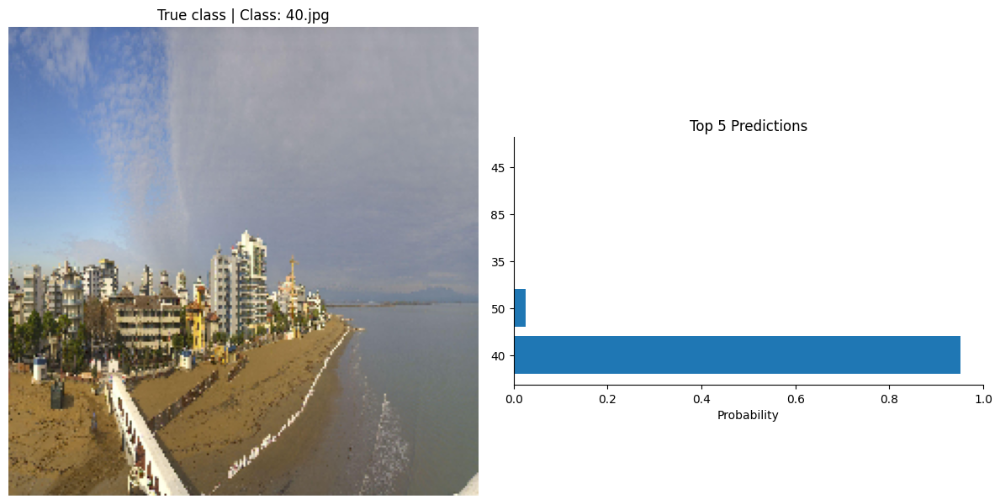

In [51]:
top_n = 5
# Get top 5 predictions
top_5_preds = np.argsort(predictions[0])[:-top_n-1:-1]
top_5_probs = predictions[0][top_5_preds]

# Get class names for top 5 predictions
# Assuming 'class_names' variable contains all the class names
top_5_names = [class_names[i] for i in top_5_preds]

# Get true label name

true_label_name = "Class: 40.jpg"

# Plot image and bar chart
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(img)
ax1.axis('off')
ax1.set_title(f'True class | {true_label_name}')# Set the title to show the true label

ax2.barh(np.arange(top_n), top_5_probs[::-1])
ax2.set_aspect(0.1)
ax2.set_yticks(np.arange(top_n))
ax2.set_yticklabels(top_5_names[::-1], fontsize=10)
ax2.invert_yaxis()
ax2.set_xlabel('Probability')
ax2.set_xlim([0, 1])
ax2.set_title('Top 5 Predictions')
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)

plt.tight_layout()
plt.show()

# Plot for each image and class  TOP 5 probabilities

1/1 [==============================] - 3s 3s/step


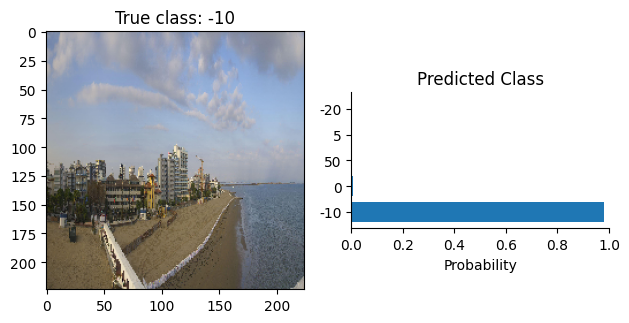

1/1 [==============================] - 0s 130ms/step


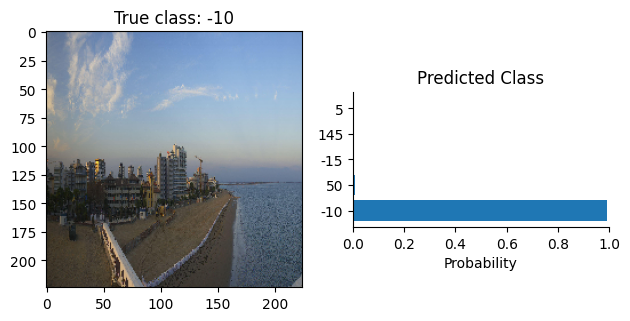

1/1 [==============================] - 0s 108ms/step


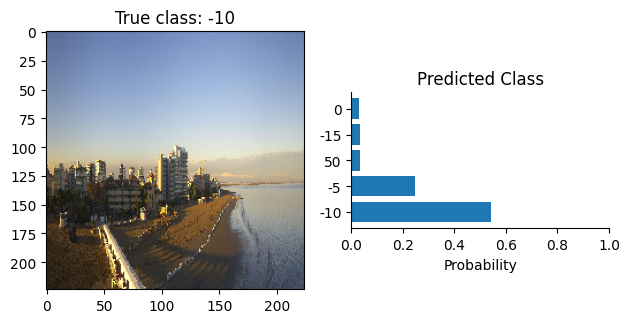

1/1 [==============================] - 0s 154ms/step


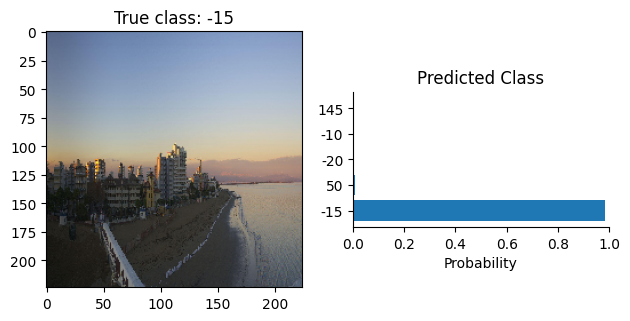

1/1 [==============================] - 0s 120ms/step


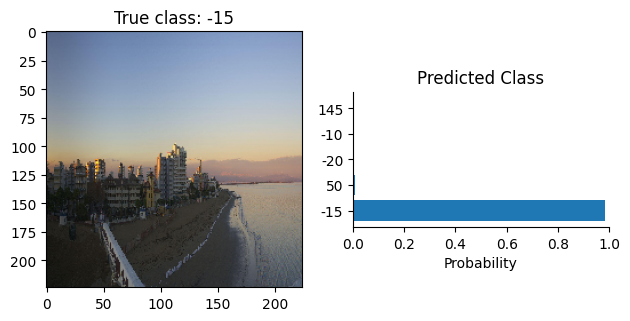

1/1 [==============================] - 0s 120ms/step


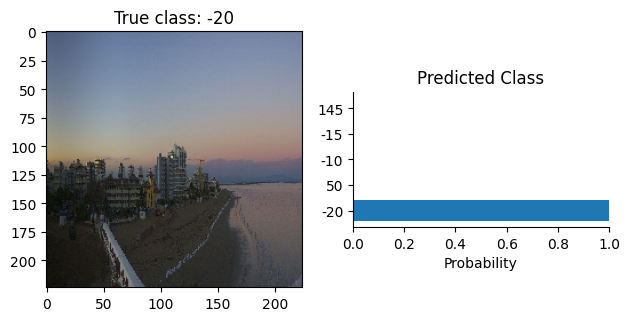

1/1 [==============================] - 0s 120ms/step


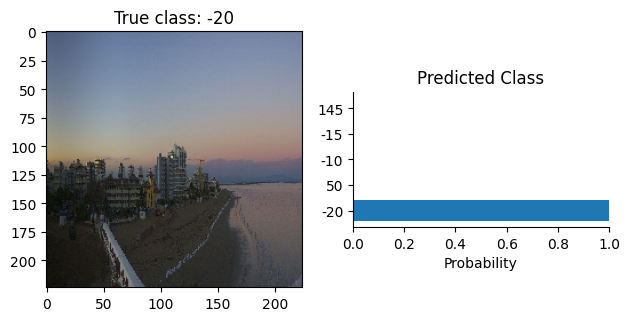

1/1 [==============================] - 0s 120ms/step


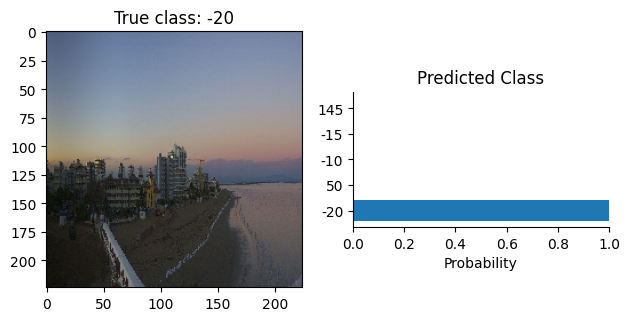

1/1 [==============================] - 0s 179ms/step


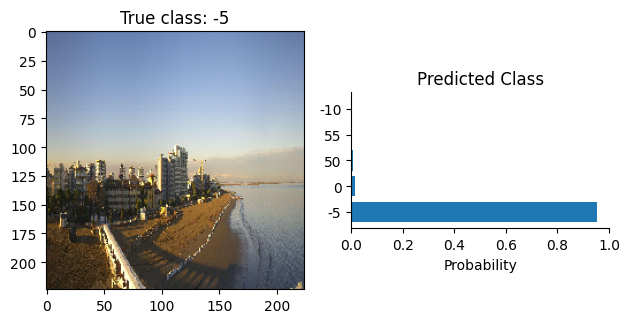

1/1 [==============================] - 0s 151ms/step


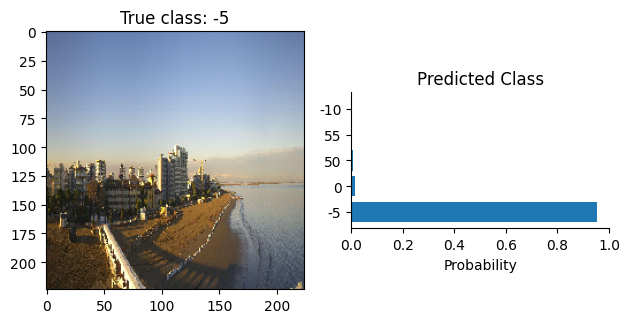

1/1 [==============================] - 0s 133ms/step


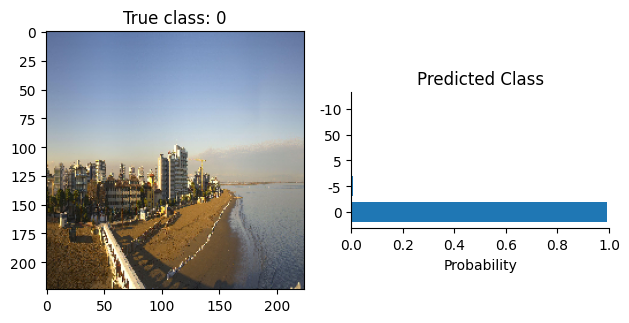

1/1 [==============================] - 0s 119ms/step


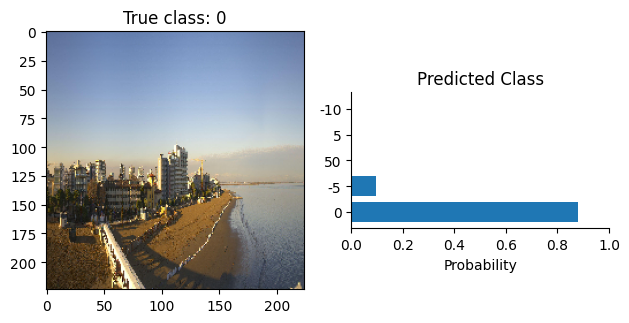

1/1 [==============================] - 0s 129ms/step


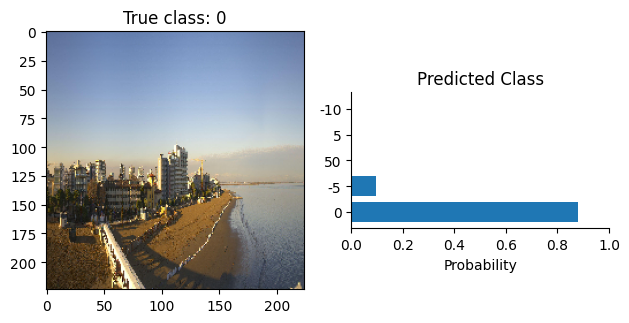

1/1 [==============================] - 0s 120ms/step


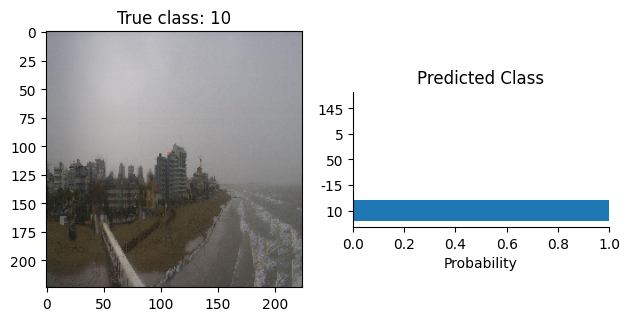

1/1 [==============================] - 0s 115ms/step


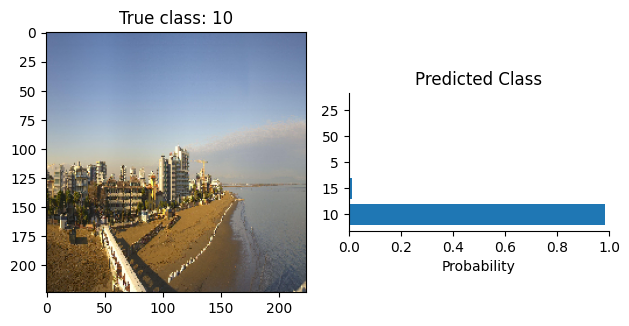

1/1 [==============================] - 0s 131ms/step


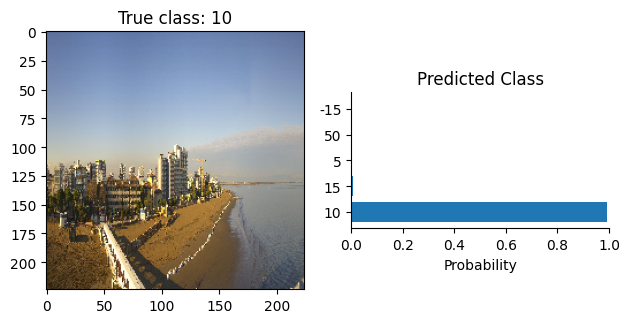

1/1 [==============================] - 0s 143ms/step


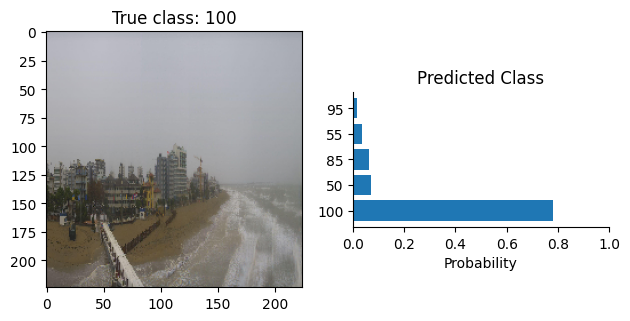

1/1 [==============================] - 0s 133ms/step


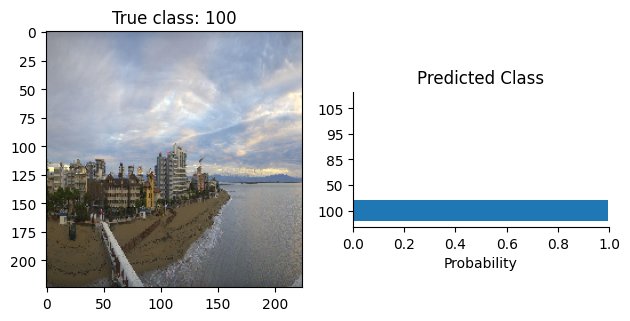

1/1 [==============================] - 0s 130ms/step


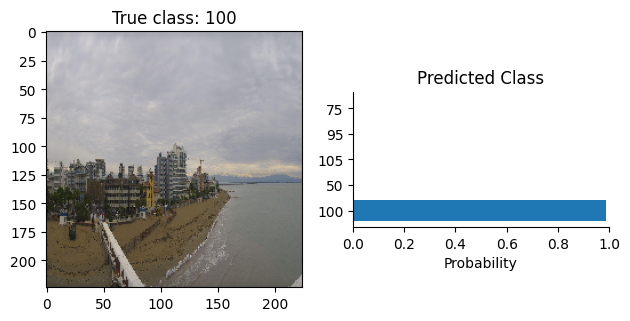

1/1 [==============================] - 0s 131ms/step


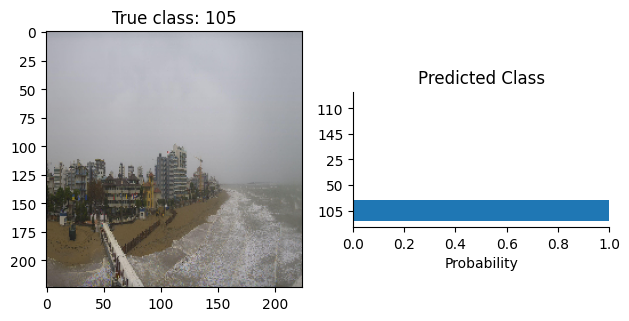

1/1 [==============================] - 0s 140ms/step


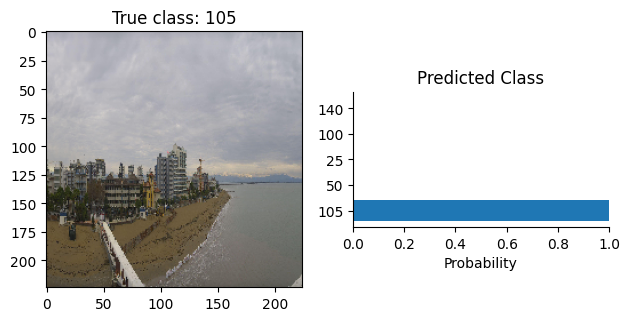

1/1 [==============================] - 0s 120ms/step


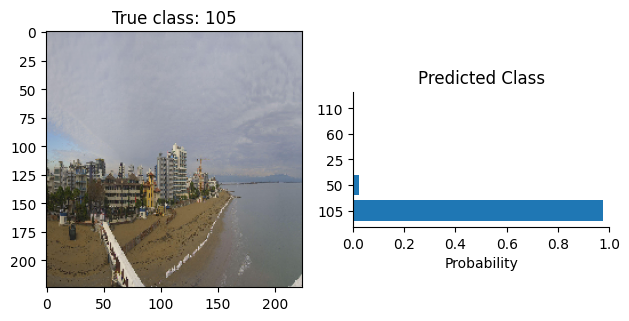

1/1 [==============================] - 0s 110ms/step


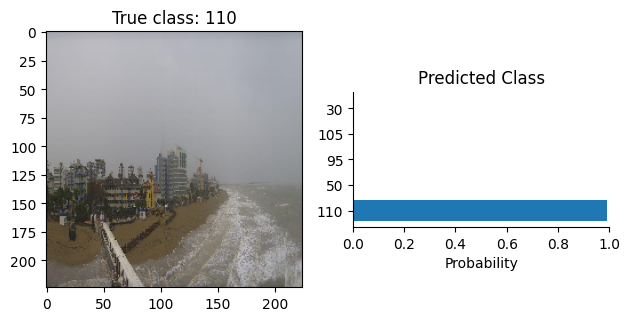

1/1 [==============================] - 0s 120ms/step


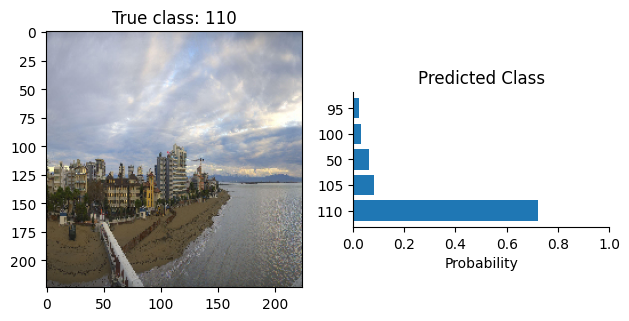

1/1 [==============================] - 0s 150ms/step


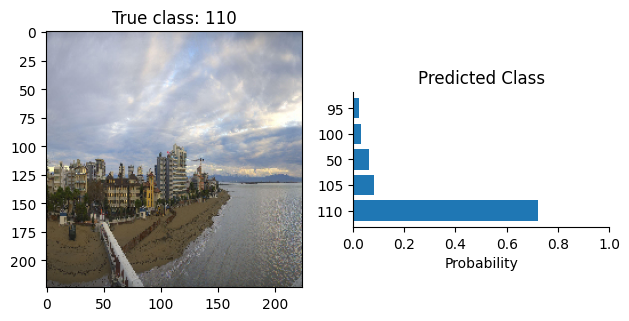

1/1 [==============================] - 0s 145ms/step


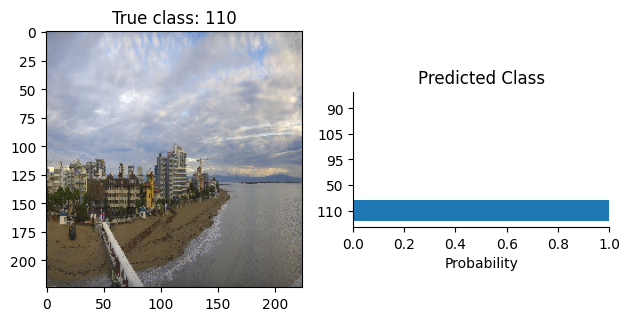

1/1 [==============================] - 0s 151ms/step


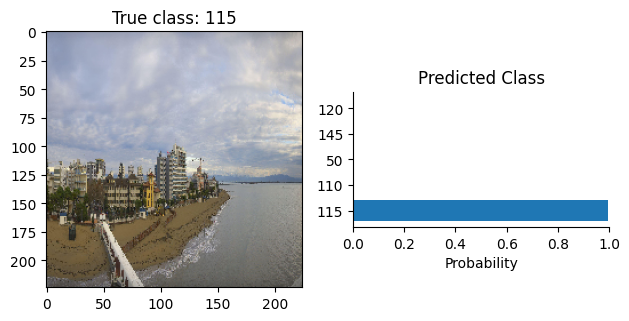

1/1 [==============================] - 0s 117ms/step


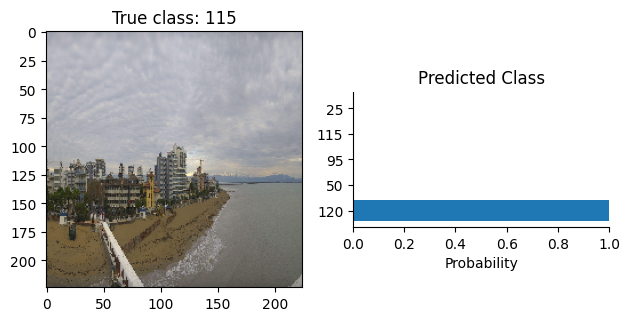

1/1 [==============================] - 0s 120ms/step


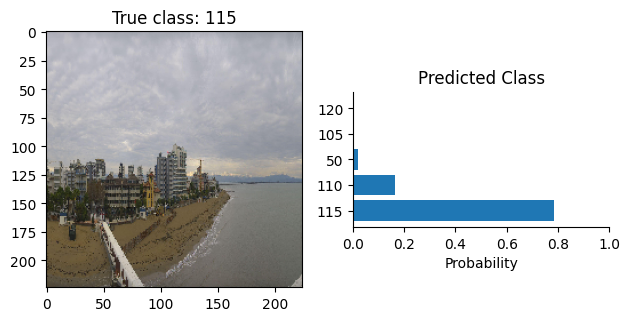

1/1 [==============================] - 0s 130ms/step


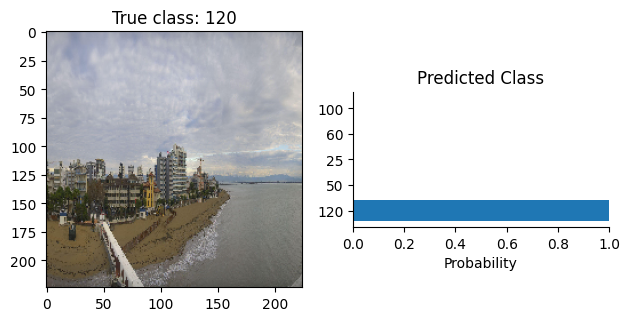

1/1 [==============================] - 0s 120ms/step


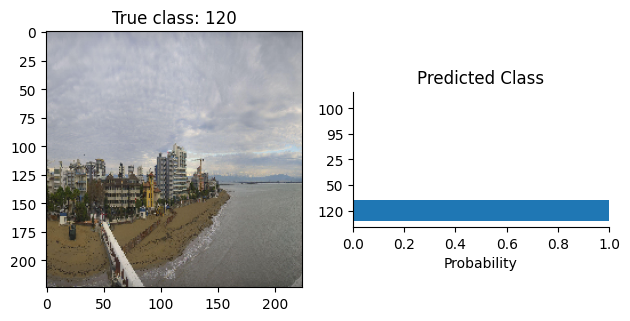

1/1 [==============================] - 0s 135ms/step


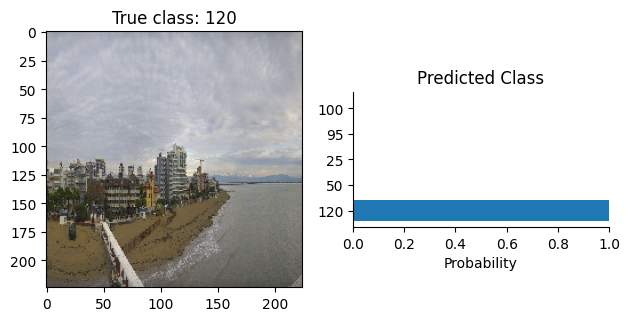

1/1 [==============================] - 0s 117ms/step


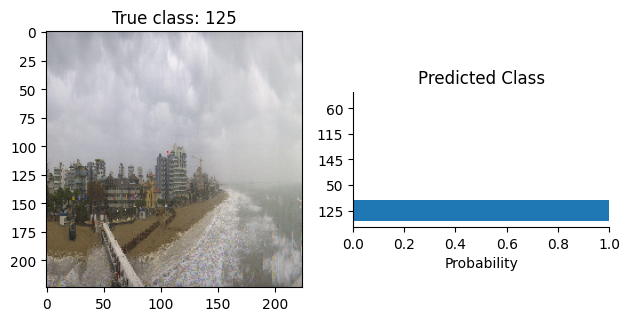

1/1 [==============================] - 0s 143ms/step


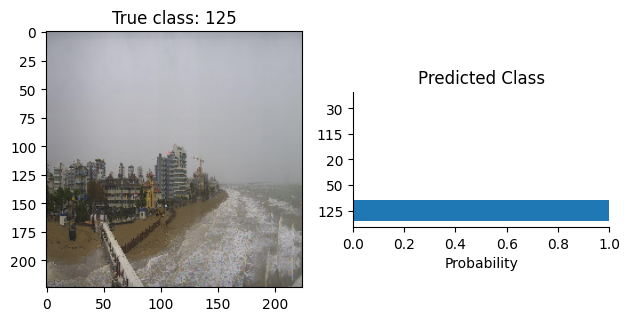

1/1 [==============================] - 0s 124ms/step


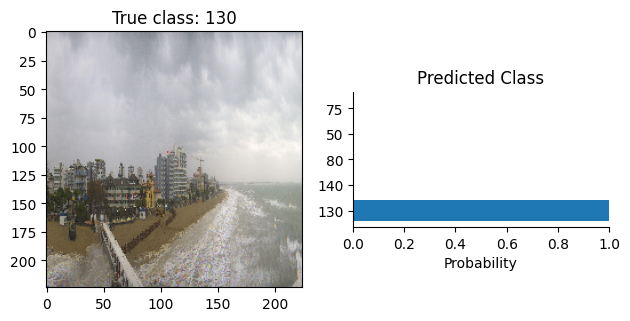

1/1 [==============================] - 0s 148ms/step


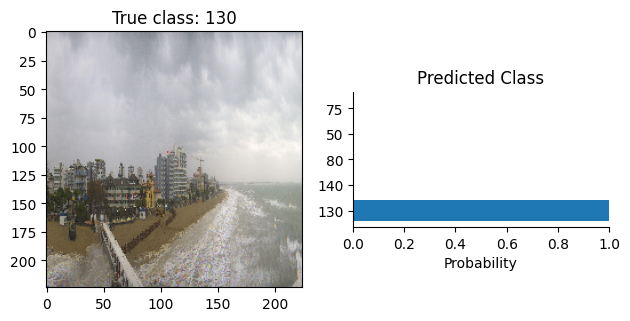

1/1 [==============================] - 0s 140ms/step


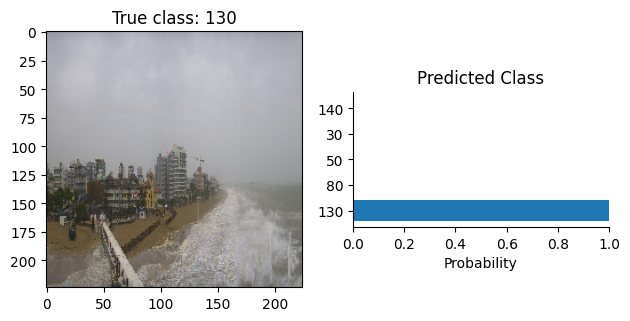

1/1 [==============================] - 0s 149ms/step


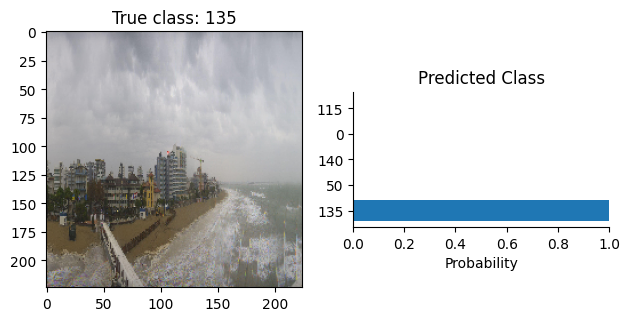

1/1 [==============================] - 0s 120ms/step


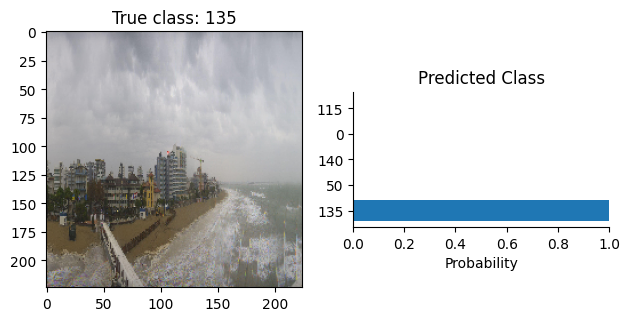

1/1 [==============================] - 0s 126ms/step


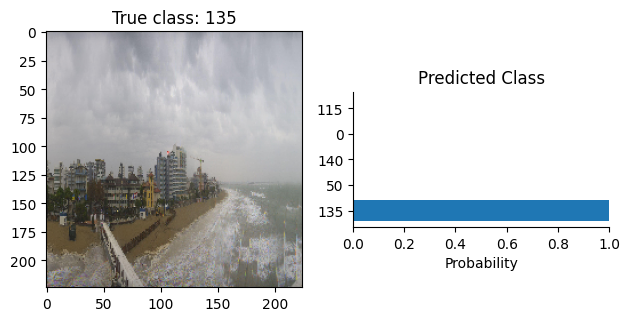

1/1 [==============================] - 0s 120ms/step


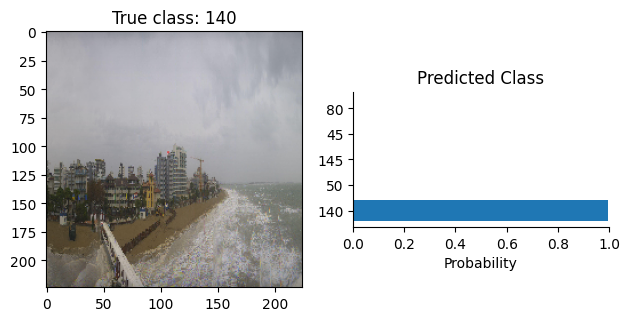

1/1 [==============================] - 0s 116ms/step


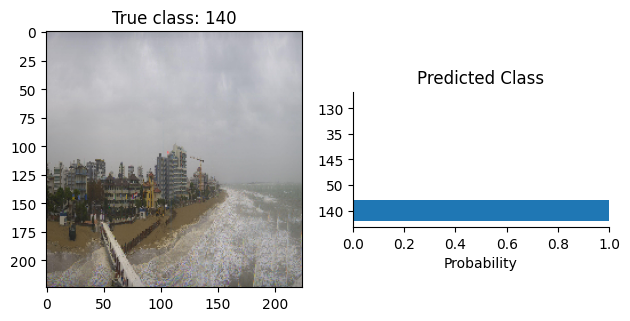

1/1 [==============================] - 0s 140ms/step


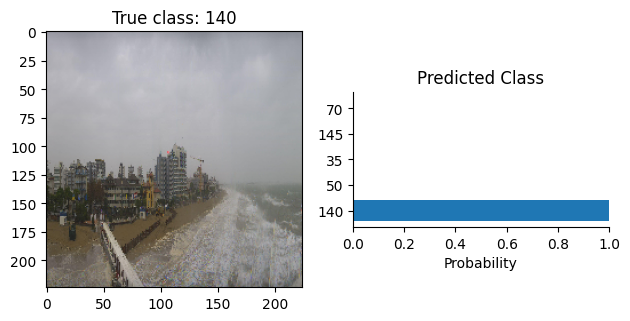

1/1 [==============================] - 0s 120ms/step


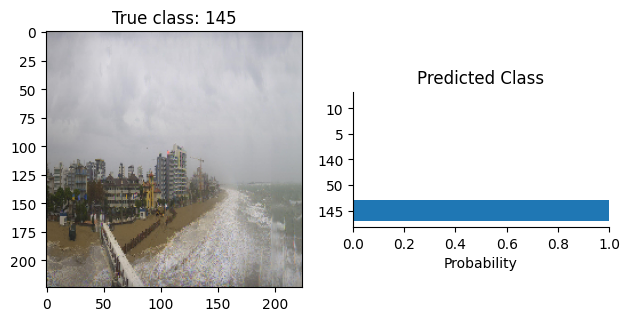

1/1 [==============================] - 0s 158ms/step


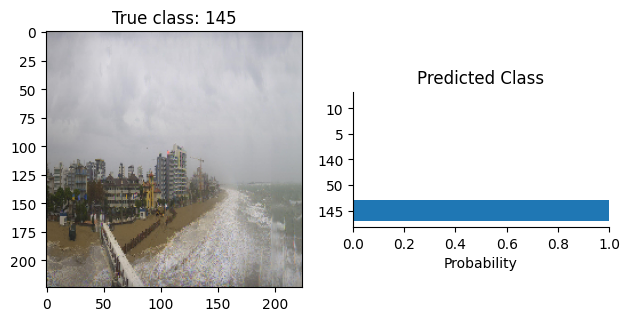

1/1 [==============================] - 0s 143ms/step


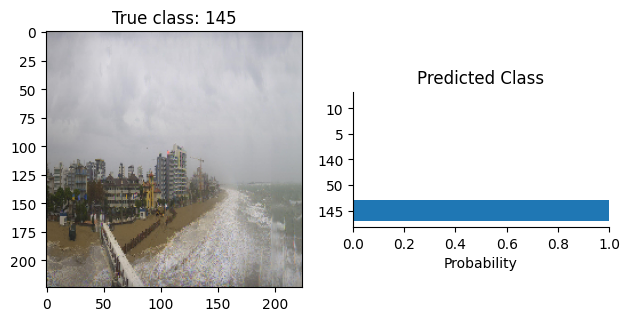

1/1 [==============================] - 0s 120ms/step


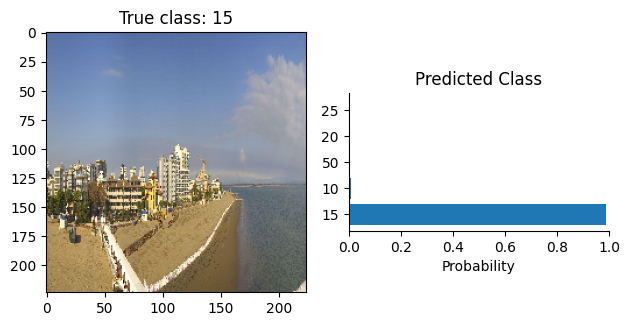

1/1 [==============================] - 0s 116ms/step


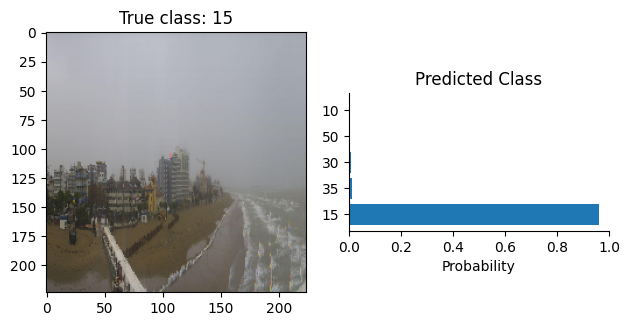

1/1 [==============================] - 0s 119ms/step


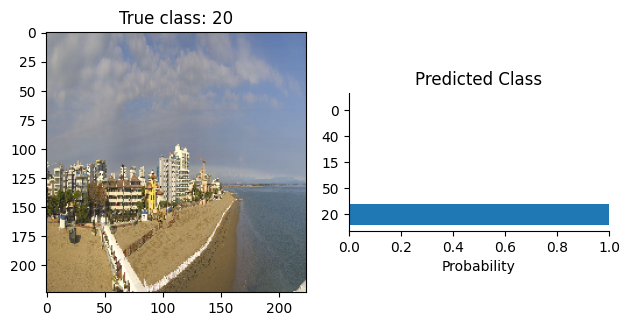

1/1 [==============================] - 0s 152ms/step


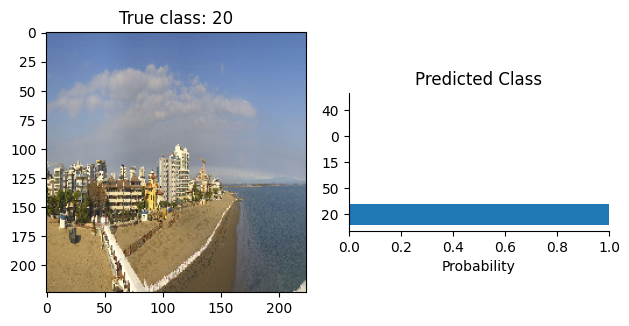

1/1 [==============================] - 0s 109ms/step


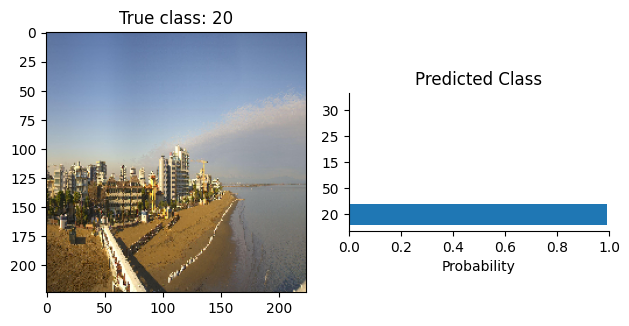

1/1 [==============================] - 0s 112ms/step


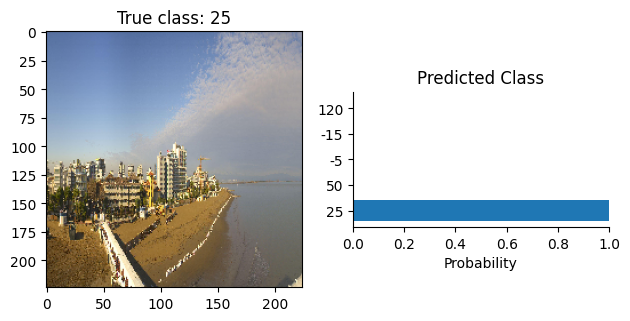

1/1 [==============================] - 0s 135ms/step


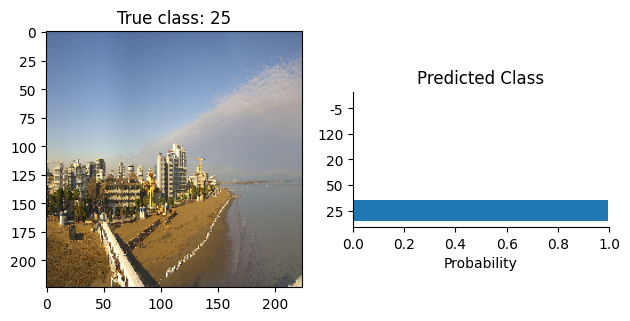

1/1 [==============================] - 0s 122ms/step


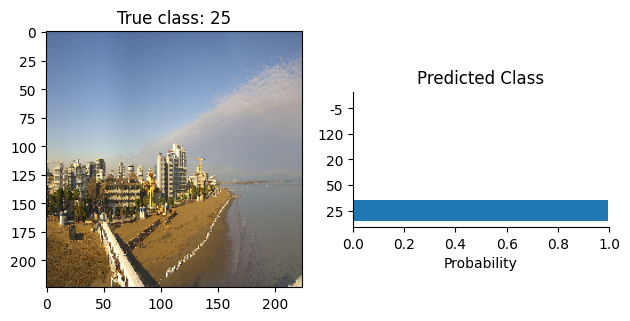

1/1 [==============================] - 0s 120ms/step


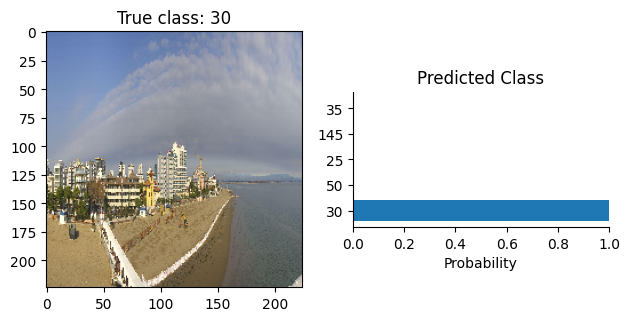

1/1 [==============================] - 0s 126ms/step


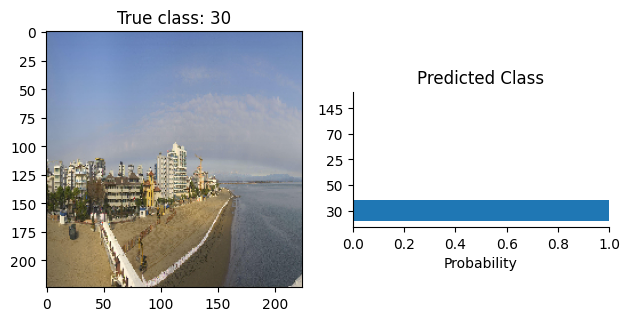

1/1 [==============================] - 0s 122ms/step


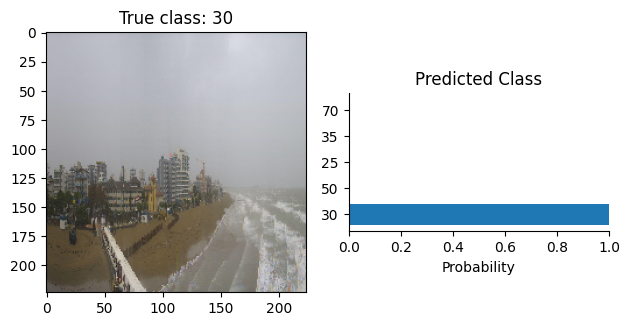

1/1 [==============================] - 0s 115ms/step


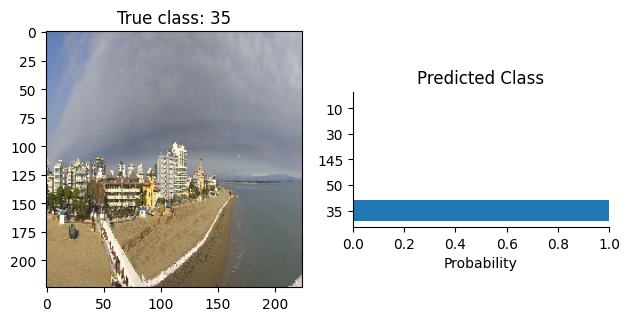

1/1 [==============================] - 0s 136ms/step


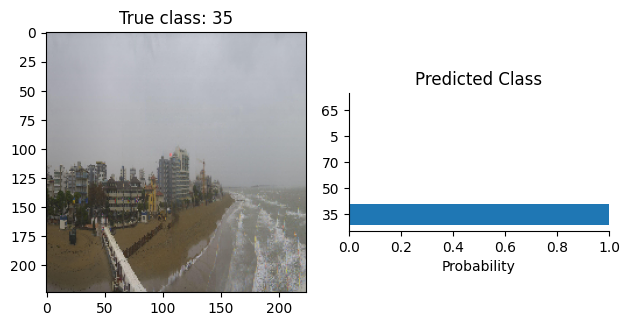

1/1 [==============================] - 0s 123ms/step


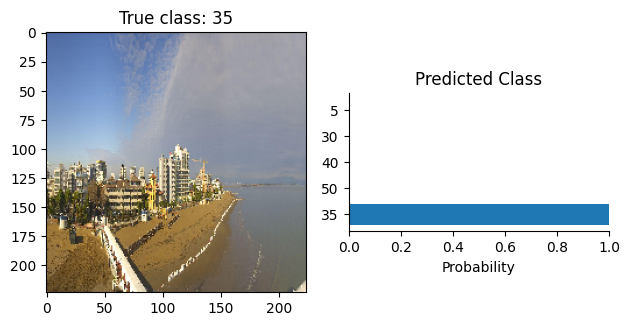

1/1 [==============================] - 0s 143ms/step


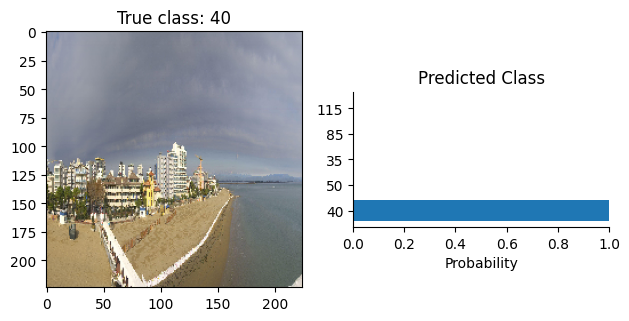

1/1 [==============================] - 0s 113ms/step


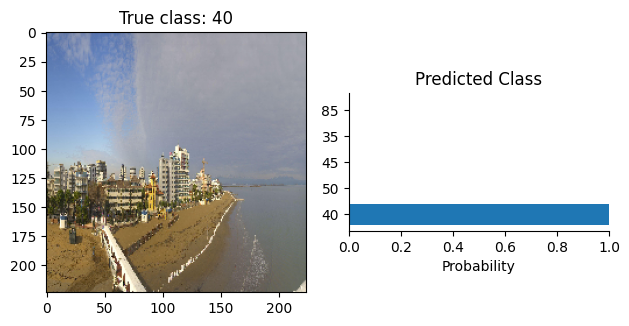

1/1 [==============================] - 0s 110ms/step


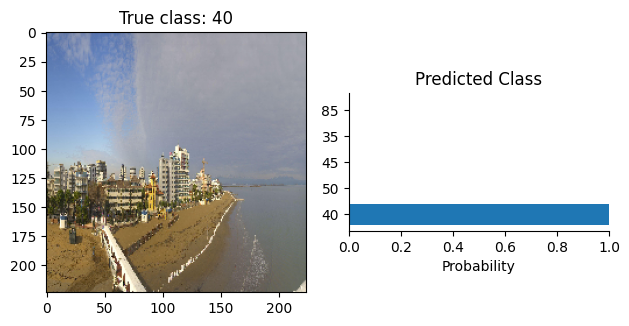

1/1 [==============================] - 0s 120ms/step


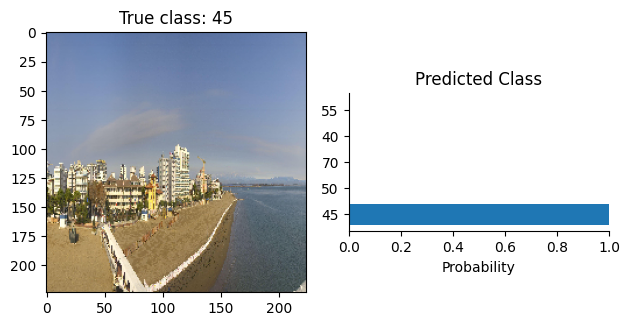

1/1 [==============================] - 0s 100ms/step


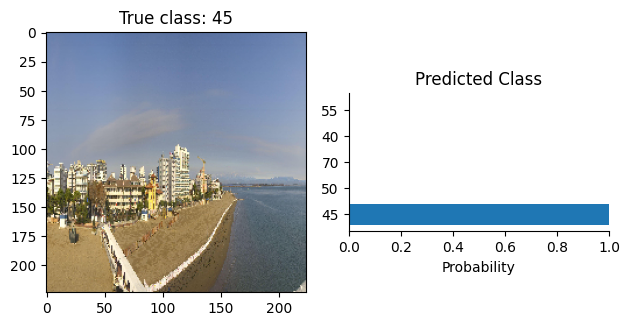

1/1 [==============================] - 0s 120ms/step


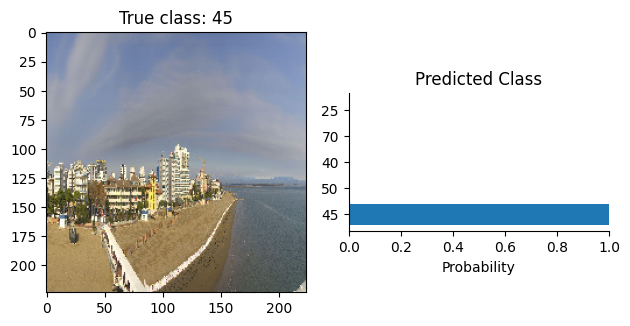

1/1 [==============================] - 0s 120ms/step


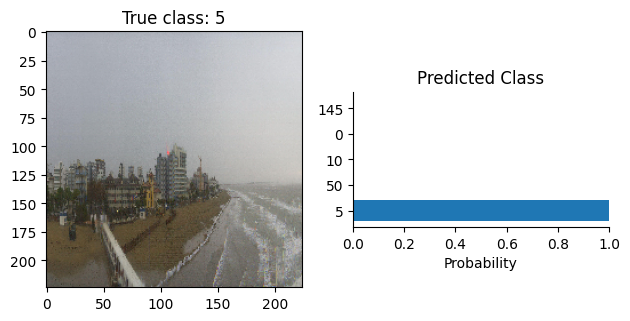

1/1 [==============================] - 0s 120ms/step


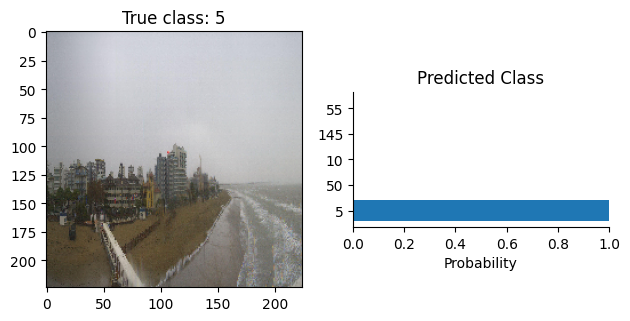

1/1 [==============================] - 0s 120ms/step


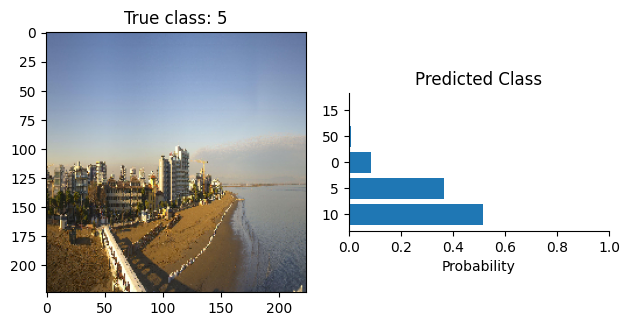

1/1 [==============================] - 0s 110ms/step


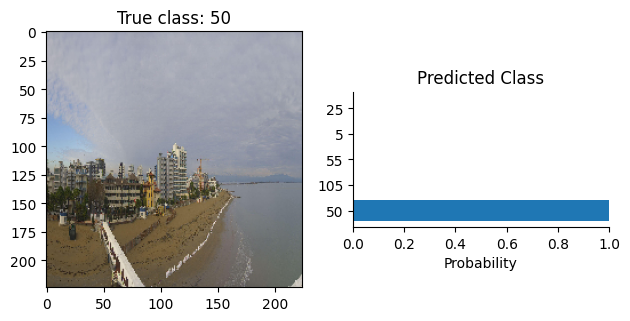

1/1 [==============================] - 0s 120ms/step


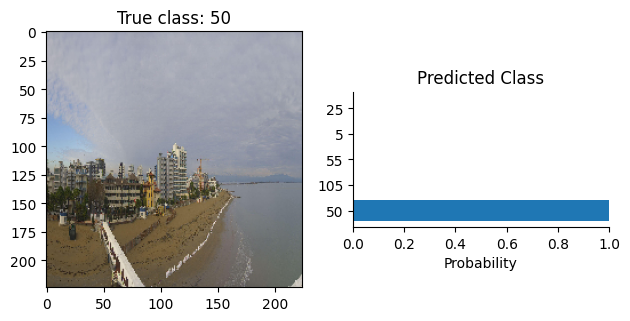

1/1 [==============================] - 0s 120ms/step


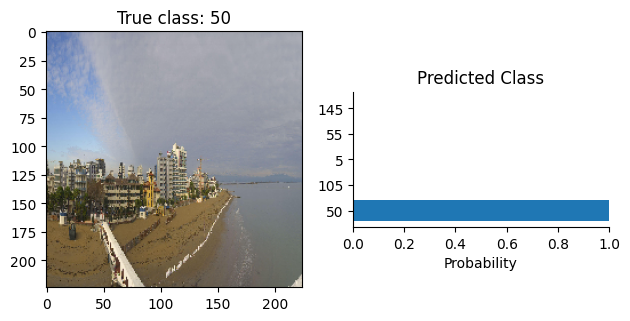

1/1 [==============================] - 0s 120ms/step


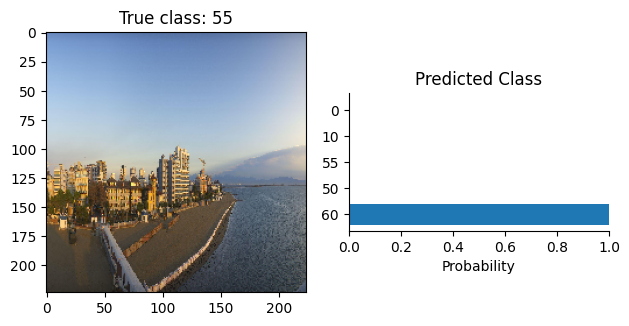

1/1 [==============================] - 0s 130ms/step


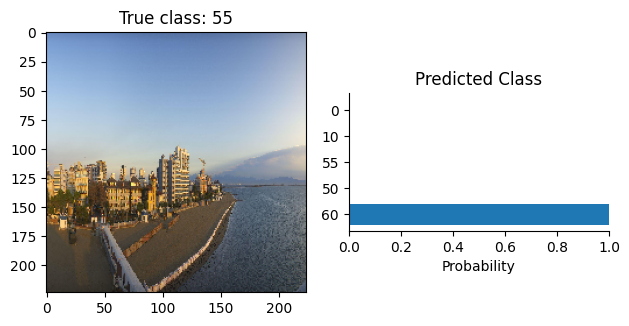

1/1 [==============================] - 0s 140ms/step


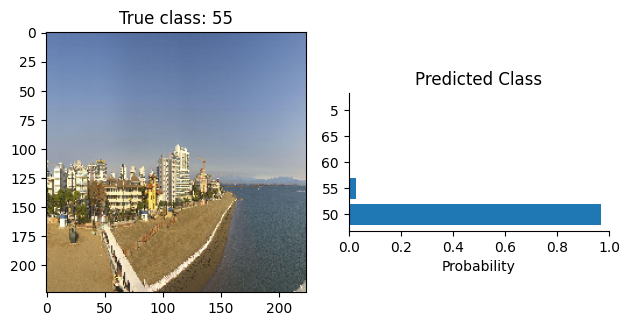

1/1 [==============================] - 0s 135ms/step


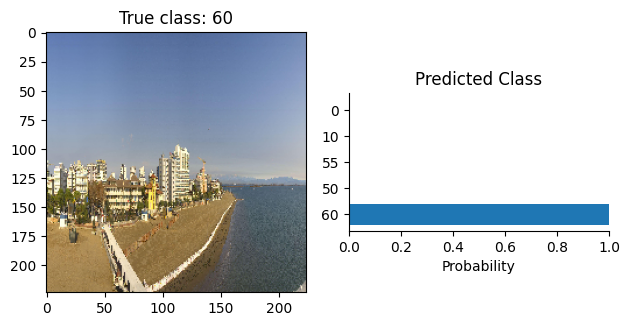

1/1 [==============================] - 0s 110ms/step


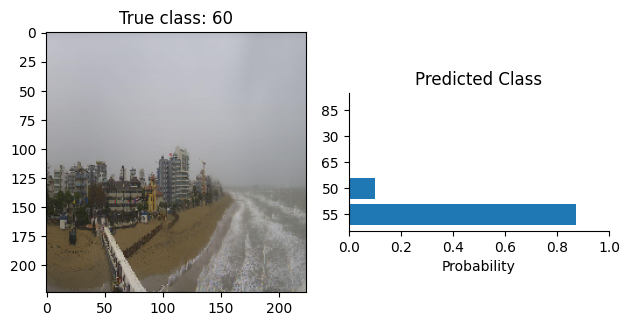

1/1 [==============================] - 0s 110ms/step


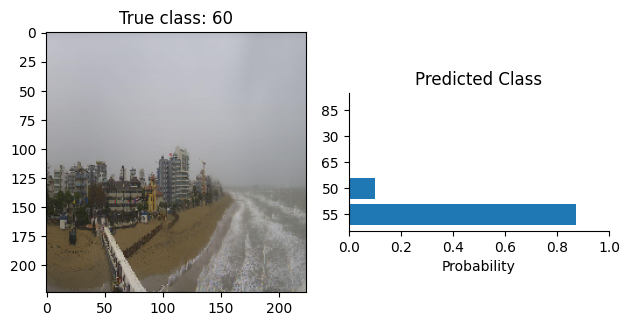

1/1 [==============================] - 0s 110ms/step


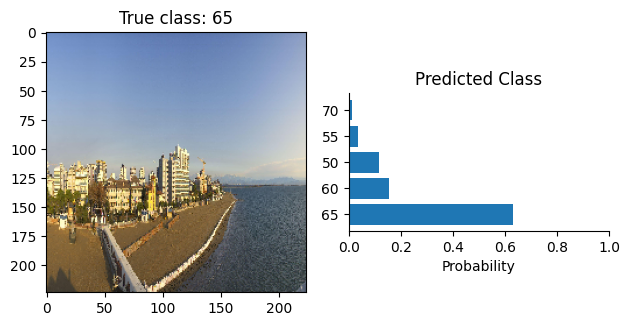

1/1 [==============================] - 0s 110ms/step


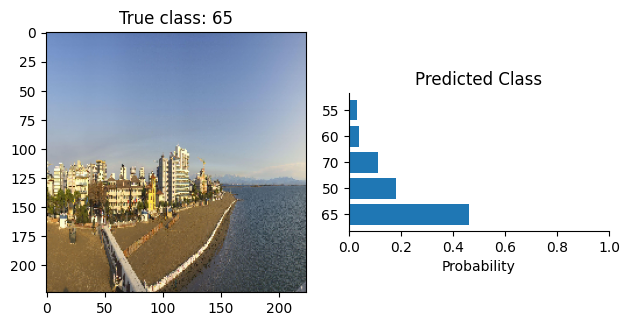

1/1 [==============================] - 0s 130ms/step


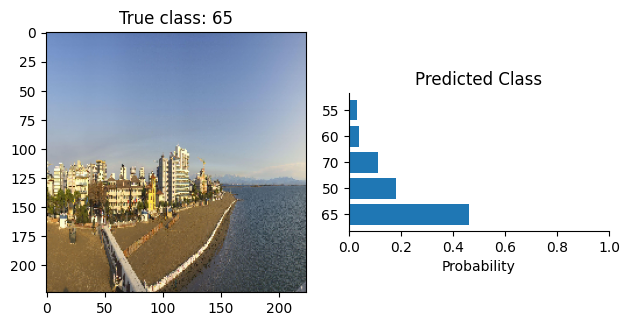

1/1 [==============================] - 0s 130ms/step


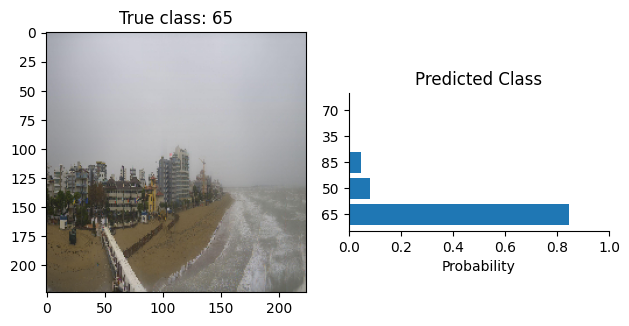

1/1 [==============================] - 0s 120ms/step


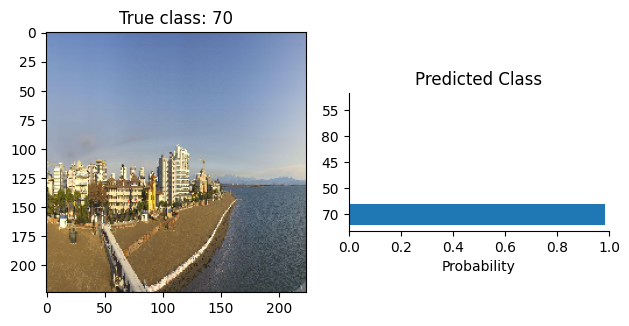

1/1 [==============================] - 0s 120ms/step


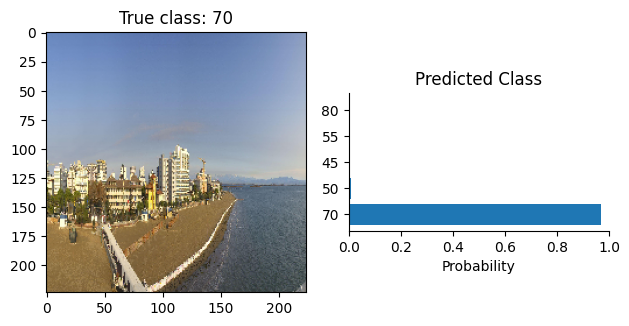

1/1 [==============================] - 0s 130ms/step


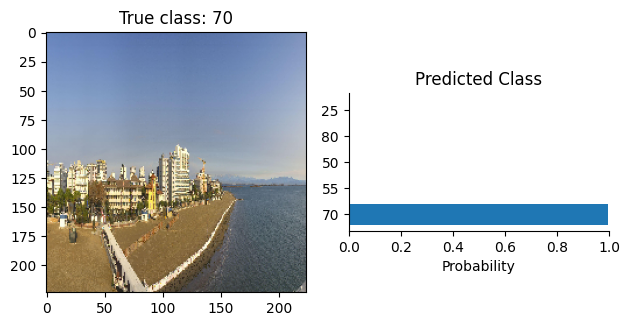

1/1 [==============================] - 0s 110ms/step


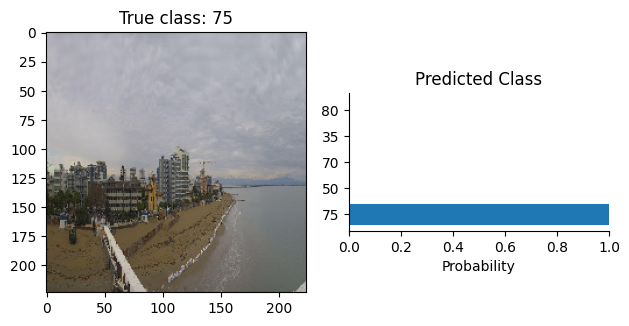

1/1 [==============================] - 0s 121ms/step


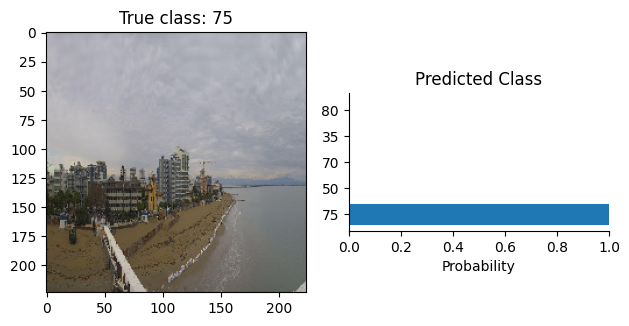

1/1 [==============================] - 0s 130ms/step


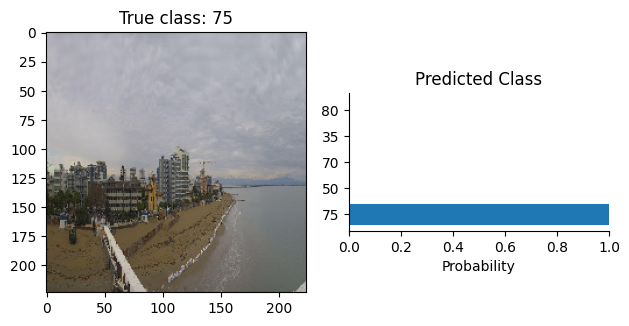

1/1 [==============================] - 0s 120ms/step


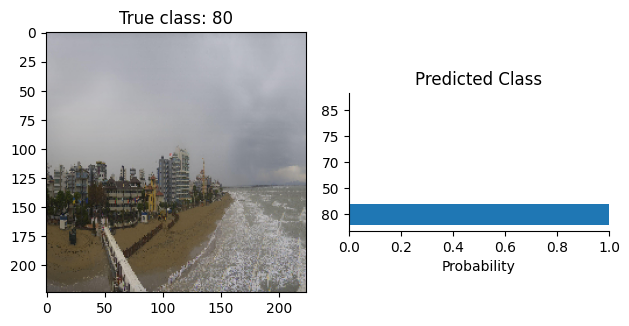

1/1 [==============================] - 0s 110ms/step


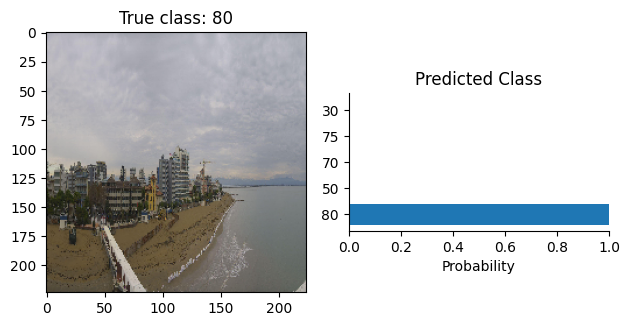

1/1 [==============================] - 0s 120ms/step


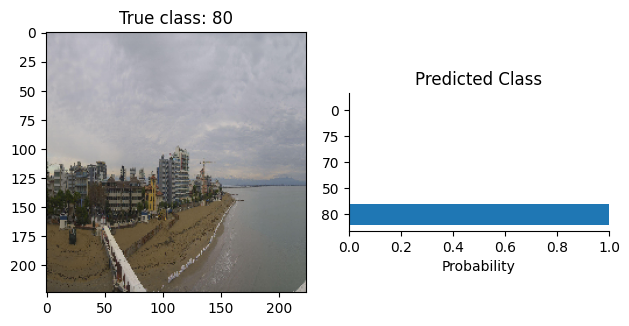

1/1 [==============================] - 0s 130ms/step


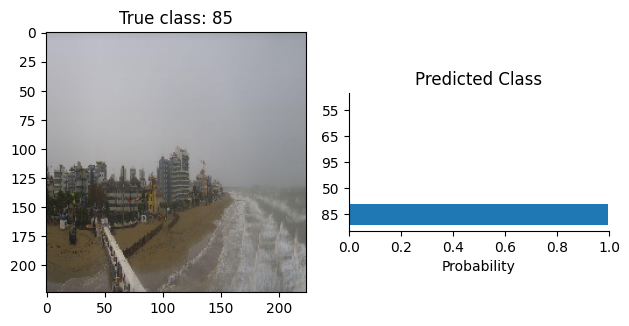

1/1 [==============================] - 0s 120ms/step


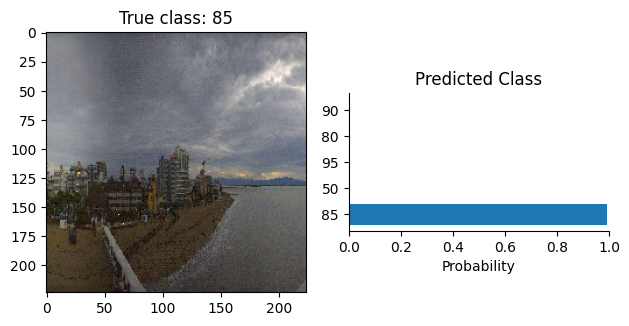

1/1 [==============================] - 0s 121ms/step


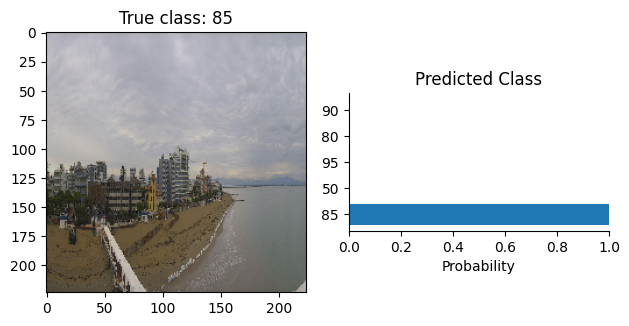

1/1 [==============================] - 0s 120ms/step


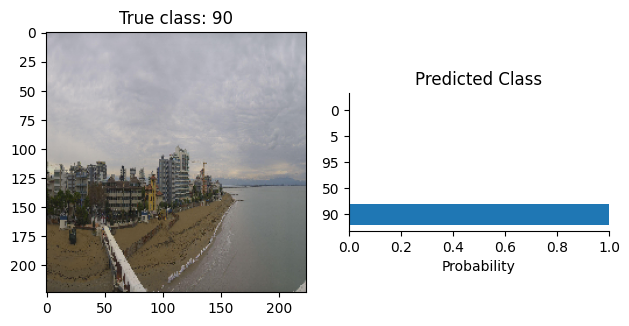

1/1 [==============================] - 0s 130ms/step


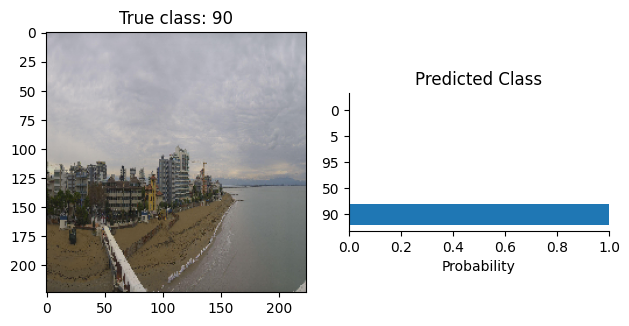

1/1 [==============================] - 0s 120ms/step


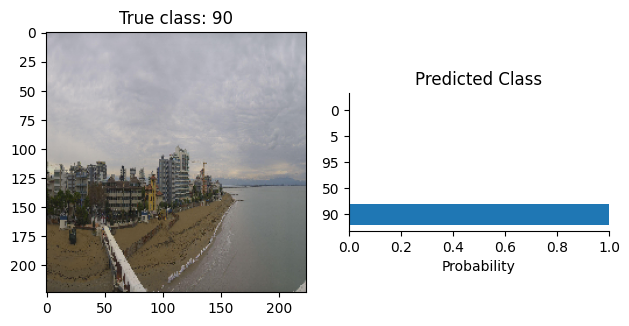

1/1 [==============================] - 0s 131ms/step


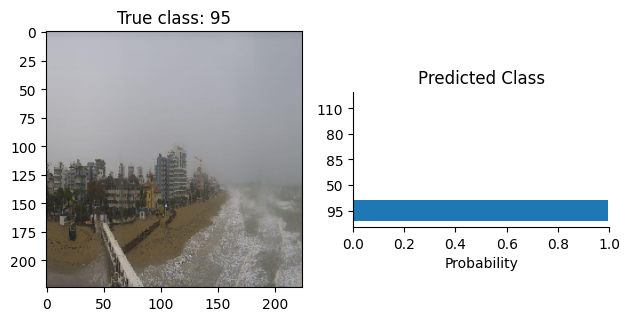

1/1 [==============================] - 0s 110ms/step


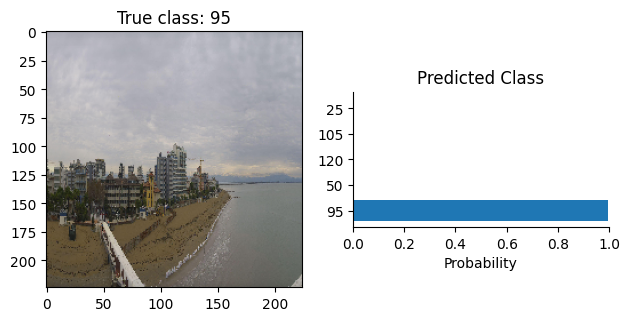

1/1 [==============================] - 0s 130ms/step


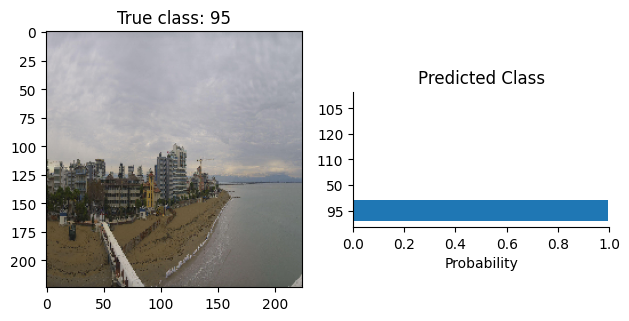

1/1 [==============================] - 0s 120ms/step


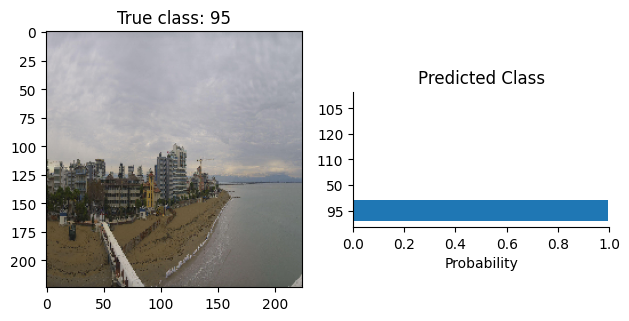

In [52]:
test_dir = 'D:/C&G materials/Dataset 4training splitted_Lignano/test'  ##Provide the test directory from Sample dataset
img_height, img_width = 224, 224
top_n = 5

# Ottieni i nomi delle classi dal generatore di dati di addestramento
class_names = val_generator.class_indices
# Inverti il dizionario per ottenere una mappa da indice di classe a nome di classe
index_to_class = {v: k for k, v in class_names.items()}

# Scorri ogni sottocartella nella directory di test
for subdir in os.listdir(test_dir):
    subdir_path = os.path.join(test_dir, subdir)
    if os.path.isdir(subdir_path):  # if path is a directory, not a file
        # Loop over each image in the subdirectory
        for filename in os.listdir(subdir_path):
            if filename.endswith('.jpg'):
                img_path = os.path.join(subdir_path, filename)
                # Carica l'immagine e adattala alle dimensioni di input del modello
                img = load_img(img_path, target_size=(img_height, img_width))
                # Converte l'immagine in un array numpy
                img_array = img_to_array(img)
                # Espandi le dimensioni dell'array per l'inserimento nel modello
                img_array_expanded = np.expand_dims(img_array, axis=0)
                # Normalizza l'immagine nello stesso modo in cui è stato fatto durante l'addestramento
                img_array_expanded /= 255.
                # Fai la previsione
                prediction = model.predict(img_array_expanded)
                # Get top 5 predictions
                top_5_preds = np.argsort(prediction[0])[:-top_n-1:-1]
                top_5_probs = prediction[0][top_5_preds]
                # Get class names for top 5 predictions
                top_5_names = [index_to_class[i] for i in top_5_preds]
                # Plot image and bar chart
                fig, (ax1, ax2) = plt.subplots(1, 2)
                ax1.imshow(img)
                ax1.axis('on')  # show image axes
                ax1.set_title("True class: " + subdir)
                ax2.barh(np.arange(top_n), top_5_probs[::-1])
                ax2.set_aspect(0.1)
                ax2.set_yticks(np.arange(top_n))
                ax2.set_yticklabels(top_5_names[::-1], fontsize=10)
                ax2.invert_yaxis()
                ax2.set_xlabel('Probability')
                ax2.set_xlim([0, 1])
                ax2.set_title('Predicted Class')
                ax2.spines['right'].set_visible(False)
                ax2.spines['top'].set_visible(False)
                plt.tight_layout()
                plt.show()

# Plotting confusion Matrix

Found 101 images belonging to 34 classes.
13/13 [==============================] - 29s 2s/step


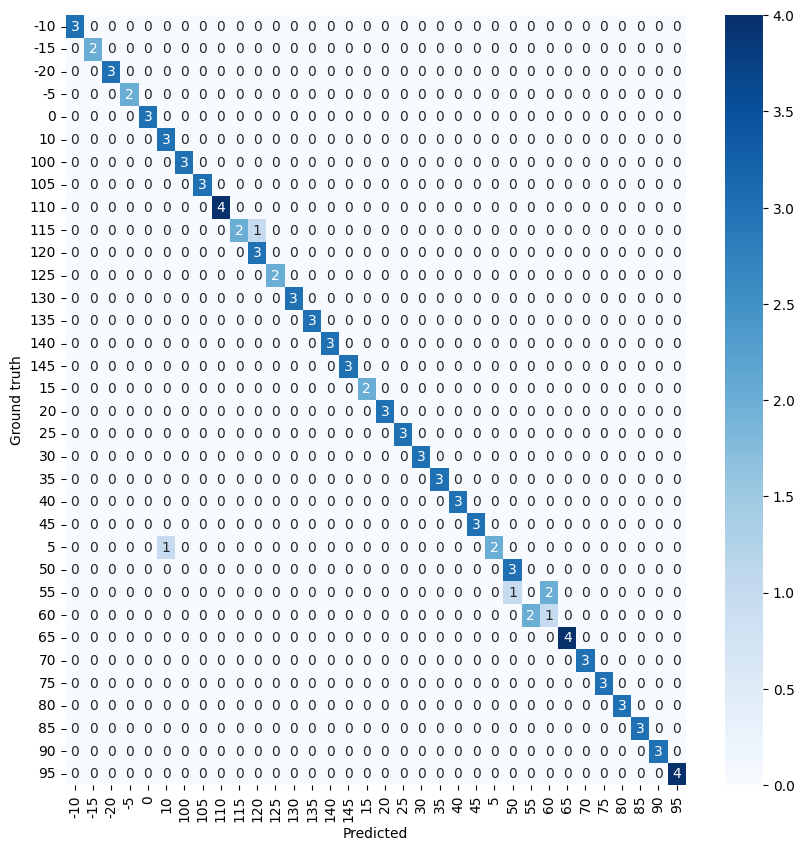

In [53]:
# Data
test_dir = 'D:/C&G materials/Dataset 4training splitted_Lignano/test' ##Provide the test directory from Sample dataset

test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_dir,  # il percorso dei tuoi dati di test
    target_size=(img_height, img_width),  # le dimensioni delle tue immagini
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False)  # importante non mischiare per la matrice di confusione

# Ottieni le etichette reali (ground truth)
ground_truth = test_generator.classes

# Ottieni le previsioni del modello
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Calcola la matrice di confusione
conf_mat = confusion_matrix(ground_truth, predicted_classes)

# Disegna la matrice di confusione usando Seaborn
plt.figure(figsize=(10, 10))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap=plt.cm.Blues,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Ground truth')
plt.show()

# calculation and printing of F1 score

In [54]:
from sklearn.metrics import f1_score

# Calcola il punteggio  totale F1 bilanciato (pesato)
f1_weighted = f1_score(ground_truth, predicted_classes, average='weighted')
print("F1 Score (Weighted):", f1_weighted)

# F1 score per ogni classe
f1_scores_per_class = f1_score(ground_truth, predicted_classes, average=None)

# Stampa i punteggi F1 per ogni classe
for i, f1_score in enumerate(f1_scores_per_class):
    print(f"Classe {i}: F1 Score = {f1_score}")

F1 Score (Weighted): 0.9258840169731258
Classe 0: F1 Score = 1.0
Classe 1: F1 Score = 1.0
Classe 2: F1 Score = 1.0
Classe 3: F1 Score = 1.0
Classe 4: F1 Score = 1.0
Classe 5: F1 Score = 0.8571428571428571
Classe 6: F1 Score = 1.0
Classe 7: F1 Score = 1.0
Classe 8: F1 Score = 1.0
Classe 9: F1 Score = 0.8
Classe 10: F1 Score = 0.8571428571428571
Classe 11: F1 Score = 1.0
Classe 12: F1 Score = 1.0
Classe 13: F1 Score = 1.0
Classe 14: F1 Score = 1.0
Classe 15: F1 Score = 1.0
Classe 16: F1 Score = 1.0
Classe 17: F1 Score = 1.0
Classe 18: F1 Score = 1.0
Classe 19: F1 Score = 1.0
Classe 20: F1 Score = 1.0
Classe 21: F1 Score = 1.0
Classe 22: F1 Score = 1.0
Classe 23: F1 Score = 0.8
Classe 24: F1 Score = 0.8571428571428571
Classe 25: F1 Score = 0.0
Classe 26: F1 Score = 0.3333333333333333
Classe 27: F1 Score = 1.0
Classe 28: F1 Score = 1.0
Classe 29: F1 Score = 1.0
Classe 30: F1 Score = 1.0
Classe 31: F1 Score = 1.0
Classe 32: F1 Score = 1.0
Classe 33: F1 Score = 1.0


# PLOT MEAN VALUES OVER THE TIME

In [55]:
from datetime import datetime, timedelta
from matplotlib.dates import date2num
import matplotlib.pyplot as plt
import os
import re
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Provide the random dataset directory
predict_dir = "D:/C&G materials/Dataset to predict_Lignano"

# Dimensioni target
img_height, img_width = 224, 224

# Ottieni i nomi delle classi dal generatore di dati di addestramento
class_names = val_generator.class_indices
# Inverti il dizionario per ottenere una mappa da indice di classe a nome di classe
index_to_class = {v: k for k, v in class_names.items()}

# Liste per memorizzare i valori medi centrali di ciascuna classe di appartenenza prevista e i timestamp corrispondenti
mean_values = []
timestamps = []

for subdir, _, _ in os.walk(predict_dir):
    for filename in os.listdir(subdir):
        if filename.endswith('.jpg'):
            img_path = os.path.join(subdir, filename)
            # Carica l'immagine e adattala alle dimensioni di input del modello
            img = load_img(img_path, target_size=(img_height, img_width))
            # Converte l'immagine in un array numpy
            img_array = img_to_array(img)
            img_array = img_array / 255.0
            # Espandi le dimensioni dell'array per l'inserimento nel modello
            img_array = np.expand_dims(img_array, axis=0)
            # Fai la previsione
            prediction = model.predict(img_array)
            # Ottieni l'indice della classe prevista
            predicted_class_index = np.argmax(prediction)
            # Ottieni il nome della classe prevista
            predicted_class_name = index_to_class[predicted_class_index]

            # Debug: print class index and class name
            print(f"Predicted class index: {predicted_class_index}")
            print(f"Predicted class name: {predicted_class_name}")


            # Estrai i limiti della classe prevista e calcola il valore medio

            try:
                # Sostituisci tutti gli underscore con trattini per mantenere la consistenza
                cleaned_predicted_class_name = predicted_class_name.replace("_", " ")

                print(f"Predicted class name after replacing underscore: {cleaned_predicted_class_name}")

                # Usa una regex per trovare tutti i numeri, inclusi quelli negativi
                limits = [float(i) for i in re.findall(r"-?\d+\.\d+|-?\d+", cleaned_predicted_class_name)]

                print(f"Limits: {limits}")

                # Calcola il valore medio
                mean_value = sum(limits) / len(limits) if limits else 0  # Evita ZeroDivisionError

                print(f"Mean value: {mean_value}")

            except Exception as e:
                print(f"An error occurred: {e}")
                print(f"Offending predicted_class_name: {predicted_class_name}")
                continue  # Skip this iteration

            mean_values.append(mean_value)

            # Estrai il timestamp dal nome del file
            timestamp_str = filename.split("_")[0]  # Assumendo che il timestamp sia prima del primo underscore
            timestamp_without_ms_str = timestamp_str[:14]
            milliseconds = int(timestamp_str[14:17])  # estrai i millisecondi

            # Converte in datetime senza i millisecondi
            dt = datetime.strptime(timestamp_without_ms_str, "%Y%m%d%H%M%S")

            # Aggiungi i millisecondi al datetime
            dt = dt + timedelta(milliseconds=milliseconds)

            # Converti il timestamp in un formato di data comprensibile da matplotlib
            timestamps.append(date2num(dt))

# Ordina le liste in base ai timestamp
timestamps, mean_values = zip(*sorted(zip(timestamps, mean_values)))

1/1 [==============================] - 0s 130ms/step
Predicted class index: 24
Predicted class name: 50
Predicted class name after replacing underscore: 50
Limits: [50.0]
Mean value: 50.0
1/1 [==============================] - 0s 126ms/step
Predicted class index: 25
Predicted class name: 55
Predicted class name after replacing underscore: 55
Limits: [55.0]
Mean value: 55.0
1/1 [==============================] - 0s 139ms/step
Predicted class index: 25
Predicted class name: 55
Predicted class name after replacing underscore: 55
Limits: [55.0]
Mean value: 55.0
1/1 [==============================] - 0s 143ms/step
Predicted class index: 25
Predicted class name: 55
Predicted class name after replacing underscore: 55
Limits: [55.0]
Mean value: 55.0
1/1 [==============================] - 0s 153ms/step
Predicted class index: 26
Predicted class name: 60
Predicted class name after replacing underscore: 60
Limits: [60.0]
Mean value: 60.0
1/1 [==============================] - 0s 151ms/step
Predict

1/1 [==============================] - 0s 110ms/step
Predicted class index: 0
Predicted class name: -10
Predicted class name after replacing underscore: -10
Limits: [-10.0]
Mean value: -10.0
1/1 [==============================] - 0s 110ms/step
Predicted class index: 0
Predicted class name: -10
Predicted class name after replacing underscore: -10
Limits: [-10.0]
Mean value: -10.0
1/1 [==============================] - 0s 110ms/step
Predicted class index: 0
Predicted class name: -10
Predicted class name after replacing underscore: -10
Limits: [-10.0]
Mean value: -10.0
1/1 [==============================] - 0s 130ms/step
Predicted class index: 1
Predicted class name: -15
Predicted class name after replacing underscore: -15
Limits: [-15.0]
Mean value: -15.0
1/1 [==============================] - 0s 120ms/step
Predicted class index: 1
Predicted class name: -15
Predicted class name after replacing underscore: -15
Limits: [-15.0]
Mean value: -15.0
1/1 [==============================] - 0s 100

1/1 [==============================] - 0s 151ms/step
Predicted class index: 25
Predicted class name: 55
Predicted class name after replacing underscore: 55
Limits: [55.0]
Mean value: 55.0
1/1 [==============================] - 0s 121ms/step
Predicted class index: 22
Predicted class name: 45
Predicted class name after replacing underscore: 45
Limits: [45.0]
Mean value: 45.0
1/1 [==============================] - 0s 158ms/step
Predicted class index: 20
Predicted class name: 35
Predicted class name after replacing underscore: 35
Limits: [35.0]
Mean value: 35.0
1/1 [==============================] - 0s 125ms/step
Predicted class index: 19
Predicted class name: 30
Predicted class name after replacing underscore: 30
Limits: [30.0]
Mean value: 30.0
1/1 [==============================] - 0s 158ms/step
Predicted class index: 17
Predicted class name: 20
Predicted class name after replacing underscore: 20
Limits: [20.0]
Mean value: 20.0
1/1 [==============================] - 0s 111ms/step
Predict

# PLOT RESULTS

C:\Users\sayhe\AppData\Local\Temp\ipykernel_52904\3714399434.py:7: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')
C:\Users\sayhe\AppData\Local\Temp\ipykernel_52904\3714399434.py:10: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.plot_date(dates, mean_values, linestyle='solid', marker=None)


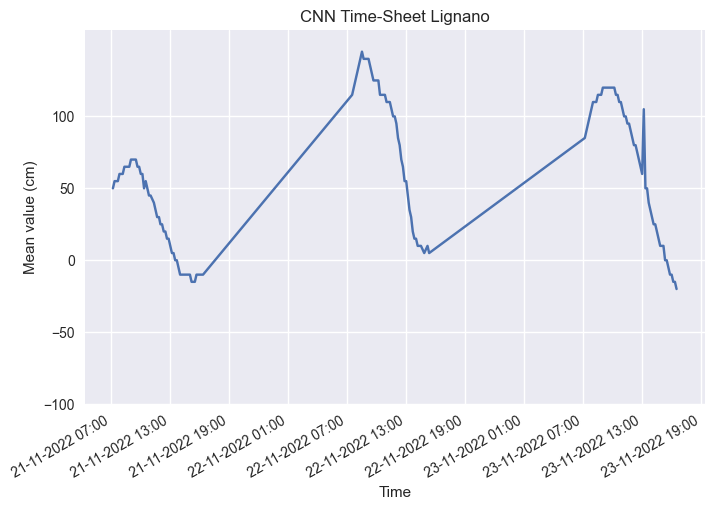

In [56]:
import matplotlib.dates as mdates
from matplotlib.dates import num2date
# Converti i timestamp seriali in oggetti datetime
dates = [num2date(ts) for ts in timestamps]

# Imposta lo stile del plot
plt.style.use('seaborn')

# Creare il grafico con una linea continua e senza marcatori.
plt.plot_date(dates, mean_values, linestyle='solid', marker=None)

# Formattare e ruotare le etichette dell'asse x per una migliore leggibilitÃ .
plt.gcf().autofmt_xdate()

# Definire il formattatore per mostrare giorno, mese, anno, ora, minuto, secondo.
myFmt = mdates.DateFormatter('%d-%m-%Y %H:%M')
plt.gca().xaxis.set_major_formatter(myFmt)

# Creare un localizzatore con intervalli di 6 ore.
time_locator = mdates.HourLocator(byhour=range(24), interval=6, tz=None)
plt.gca().xaxis.set_major_locator(time_locator)

# Imposta i limiti dell'asse y.
plt.gca().set_ylim(-40, 160)
# Qui impostiamo i tick dell'asse y a intervalli di 50.
plt.yticks(range(-100, 150, 50))
# Set the axis labels and title.
plt.xlabel('Time')
plt.ylabel('Mean value (cm)')
plt.title('CNN Time-Sheet Lignano')

# Visualizzare il grafico.
plt.show()